#**Project: Covid_19 USA**

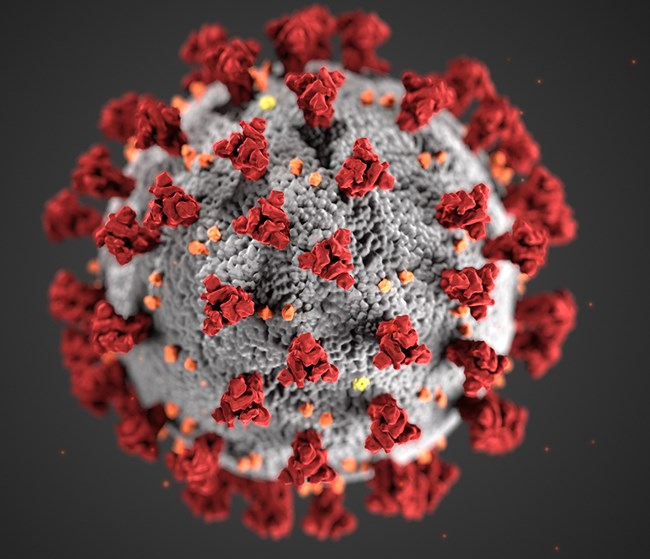

#**Youtube Video**
https://www.youtube.com/watch?v=3x-0V0rJYAY


#**Project Abstract**



Name: Sree Hari Thiriveedhi

Email: sthir004@odu.edu

Web Portfolio: https://sreehari-odu.github.io/






##**Introduction**

**Coronavirus Disease 2019 (COVID-19)**

Coronavirus disease 2019 (COVID-19) is caused by a new coronavirus first identified in Wuhan, China, in December 2019. Because it is a new virus, scientists are learning more each day. Although most people who have COVID-19 have mild symptoms, COVID-19 can also cause severe illness and even death. Some groups, including older adults and people who have certain underlying medical conditions, are at increased risk of severe illness.

**About the Name**

On February 11, 2020, the World Health Organization announced an official name for the disease that is causing the 2019 novel coronavirus outbreak. The new name of this disease is coronavirus disease 2019, abbreviated as COVID-19. In COVID-19, ***‘CO’ stands for ‘corona,’ ‘VI’ for ‘virus,’ and ‘D’ for disease***. Formerly, this disease was referred to as “2019 novel coronavirus” or “2019-nCoV.”

**Source of the Virus**

Coronaviruses, named for the crown-like spikes on their surfaces, are a large family of viruses that are common in people and many different species of animals, including camels, cattle, cats, and bats. There are many types of human coronaviruses, including some that commonly cause mild upper-respiratory tract illnesses. COVID-19 is a new disease, caused by a novel (or new) coronavirus that has not previously been seen in humans.
Animal coronaviruses rarely infect people and then spread between people. This occurred with two earlier coronaviruses, MERS-CoV and SARS-CoV.

SARS-CoV-2 virus is a beta coronavirus, like MERS-CoV and SARS-CoV. These viruses have their origins in bats. Although we do not know the exact source of the current outbreak of COVID-19, we know that it originally came from an animal, likely a bat. The sequences from U.S. patients are similar to the one that China initially posted, suggesting a likely single, recent emergence of this virus from an animal reservoir.

**The goal of the project is to analyse the spread of COVID-19 and its impact on USA population. We will be analysing trends based on demographics as well as how the disease spread in different states in US. And we also predict covid cases and deaths for the next 1,3 and 6 months in USA**

## **Data Source:**

Two datasets from CDC will be used for this project. One dataset provides information about demographics for COVID-19 cases and the second dataset priovides information about cases and deaths by state. 


Dataset 1: COVID-19 Case Surveillance Public Use Data

URL: https://data.cdc.gov/Case-Surveillance/COVID-19-Case-Surveillance-Public-Use-Data/vbim-akqf

Dataset 2: United States COVID-19 Cases and Deaths by State over Time

URL: https://data.cdc.gov/Case-Surveillance/United-States-COVID-19-Cases-and-Deaths-by-State-o/9mfq-cb36


#**Libraries**

##**Install Libraries**

In [ ]:
from IPython.display import clear_output
clear_output()
!pip install --upgrade geopandas
!pip install --upgrade pyshp
!pip install --upgrade shapely
!pip install --upgrade plotly-geo
!pip install --upgrade geojson
!pip install --upgrade plotly
clear_output()

In [ ]:
from IPython.display import clear_output
clear_output()
!pip install pandas-profiling
clear_output()

In [ ]:
from IPython.display import clear_output
clear_output()
%pip install "tornado>=5" 
%pip install "dask[complete]"

clear_output()
!pip install shap
!pip install plotly-express
!pip install pingouin

clear_output()

##**Import Libraries**

In [ ]:
import dask
import dask.dataframe as dd 
import dask.array as da 
import time
# Statistical Analysis
import pingouin as pg

import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from statsmodels.regression.linear_model import OLS
from statsmodels.formula.api import ols
from statsmodels.graphics.gofplots import ProbPlot
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.nonparametric.smoothers_lowess import lowess

from scipy.stats import pearsonr, ttest_ind, norm, chi2_contingency, fisher_exact, spearmanr

import scipy.stats as stats

#Machine Learning Packages
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

import shap
shap.initjs()


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
import csv
from pandas import Series,DataFrame
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import math
import time
import random
import plotly.express as px
import plotly.graph_objs as go 
import plotly.offline as py
import json 
from urllib.request import urlopen
import warnings## to avoid warning messages
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

from datetime import date, timedelta
from datetime import date
import folium
from folium.plugins import TimeSliderChoropleth
import pandas_profiling as pf

# **Dataset**

CDC reports aggregate counts of COVID-19 cases and death numbers daily online. Data on the COVID-19 website and CDC’s COVID Data Tracker are based on these most recent numbers reported by states, territories, and other jurisdictions. This data set of “United States COVID-19 Cases and Deaths by State over Time” combines this information. However, data are dependent on jurisdictions’ timely and accurate reporting.

There are currently 60 public health jurisdictions reporting cases of COVID-19. This includes the 50 states, the District of Columbia, New York City, the U.S. territories of American Samoa, Guam, the Commonwealth of the Northern Mariana Islands, Puerto Rico, and the U.S Virgin Islands as well as three independent countries in compacts of free association with the United States, Federated States of Micronesia, Republic of the Marshall Islands, and Republic of Palau. New York State’s reported case and death counts do not include New York City’s counts as they separately report nationally notifiable conditions to CDC.

**Accuracy of Data**

CDC tracks COVID-19 illnesses, hospitalizations, and deaths to track trends, detect outbreaks, and monitor whether public health measures are working. However, counting exact numbers of COVID-19 cases is not possible. COVID-19 can cause mild illness, symptoms might not appear immediately, there are delays in reporting and testing, not everyone who is infected gets tested or seeks medical care, and there are differences in how completely states and territories report their cases.


**About the dataset features:**

**submission_date**: Date of counts

**state**: Jurisdiction

**tot_cases**: Total number of cases

**conf_cases**: Total number of confirmed cases

**prob_cases**: Total probable cases

**new_case**: Number of new cases

**pnew_case**: Number of new probable cases

**tot_death**: Total number of deaths

**conf_death**: Total number of confirmed deaths

**prob_death**: Total number of probable deaths

**new_death**:  Number of new deaths

**pnew_death**: Number of new probable deaths

**created_at**: Date and time record was created

**consent_cases**: If Agree, then confirmed and probable cases are inluded. If Not Agree, then only total cases are included

**consent_deaths**: If Agree, then confirmed and probable cases are inluded. If Not Agree, then only total cases are included


In [ ]:
dataset = pd.read_csv('https://data.cdc.gov/api/views/9mfq-cb36/rows.csv?accessType=DOWNLOAD',",") 
pd.set_option('display.max_columns',None)
#print(dataset.columns.to_list(),'\n')
display(dataset.head())



,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,03/11/2021,KS,297229,241035.0,56194.0,0,0.0,4851,NaN,NaN,0,0.0,03/12/2021 03:20:13 PM,Agree,NaN
1,02/12/2021,UT,359641,359641.0,0.0,1060,0.0,1785,1729.0,56.0,11,2.0,02/13/2021 02:50:08 PM,Agree,Agree
2,02/04/2020,AR,0,NaN,NaN,0,NaN,0,NaN,NaN,0,NaN,03/26/2020 04:22:39 PM,Not agree,Not agree
3,08/22/2020,AR,56199,NaN,NaN,547,0.0,674,NaN,NaN,11,0.0,08/23/2020 02:15:28 PM,Not agree,Not agree
4,10/22/2020,MP,88,88.0,0.0,0,0.0,2,2.0,0.0,0,0.0,10/23/2020 01:44:31 PM,Agree,Agree


In [ ]:
state_mapping = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

In [ ]:
dataset.dtypes

submission_date     object
state               object
tot_cases            int64
conf_cases         float64
prob_cases         float64
new_case             int64
pnew_case          float64
tot_death            int64
conf_death         float64
prob_death         float64
new_death            int64
pnew_death         float64
created_at          object
consent_cases       object
consent_deaths      object
dtype: object

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31680 entries, 0 to 31679
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   submission_date  31680 non-null  object 
 1   state            31680 non-null  object 
 2   tot_cases        31680 non-null  int64  
 3   conf_cases       15075 non-null  float64
 4   prob_cases       15004 non-null  float64
 5   new_case         31680 non-null  int64  
 6   pnew_case        27345 non-null  float64
 7   tot_death        31680 non-null  int64  
 8   conf_death       15542 non-null  float64
 9   prob_death       15542 non-null  float64
 10  new_death        31680 non-null  int64  
 11  pnew_death       27286 non-null  float64
 12  created_at       31680 non-null  object 
 13  consent_cases    25872 non-null  object 
 14  consent_deaths   26928 non-null  object 
dtypes: float64(6), int64(4), object(5)
memory usage: 3.6+ MB


###**Sorting and Cleaning Data**

In [ ]:
#sorting the data
dataset["submission_date"] = pd.to_datetime(dataset["submission_date"])
sor = dataset.sort_values(by="submission_date", ascending=False)
display(sor.head())

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
30403,2021-07-02,AS,0,NaN,NaN,0,0.0,0,NaN,NaN,0,0.0,07/03/2021 01:44:06 PM,NaN,NaN
5644,2021-07-02,UT,416110,416110.0,0.0,431,0.0,2378,2307.0,71.0,3,0.0,07/03/2021 01:44:06 PM,Agree,Agree
21789,2021-07-02,AZ,895873,827217.0,68656.0,526,40.0,17961,15996.0,1965.0,22,2.0,07/03/2021 01:44:06 PM,Agree,Agree
24435,2021-07-02,DC,49378,NaN,NaN,16,0.0,1141,NaN,NaN,0,0.0,07/03/2021 01:44:06 PM,NaN,NaN
13681,2021-07-02,MI,1000375,894957.0,105418.0,134,33.0,21009,19754.0,1255.0,-4,0.0,07/03/2021 01:44:06 PM,Agree,Agree


In [ ]:
#cleaning the data
cleandata = dataset.fillna({
    'conf_cases':0,
    'prob_cases':0,
    'conf_death':0,
    'prob_death':0,
    'pnew_case':0,
    'pnew_death':0,
    'consent_cases':"Not agree",
    'consent_deaths':"Not agree"})
data = cleandata.where(~cleandata['state'].isin(["AS","FSM","GU","MP","VI","RMI","PW","DC"]))
data = data.dropna()
display(data.head())

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-03-11,KS,297229.0,241035.0,56194.0,0.0,0.0,4851.0,0.0,0.0,0.0,0.0,03/12/2021 03:20:13 PM,Agree,Not agree
1,2021-02-12,UT,359641.0,359641.0,0.0,1060.0,0.0,1785.0,1729.0,56.0,11.0,2.0,02/13/2021 02:50:08 PM,Agree,Agree
2,2020-02-04,AR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Not agree,Not agree
3,2020-08-22,AR,56199.0,0.0,0.0,547.0,0.0,674.0,0.0,0.0,11.0,0.0,08/23/2020 02:15:28 PM,Not agree,Not agree
5,2020-06-02,IA,20015.0,0.0,0.0,317.0,0.0,561.0,0.0,0.0,12.0,0.0,06/03/2020 02:11:36 PM,Not agree,Not agree


#**Total Cases and Deaths**

In [ ]:
today = date.today()
#update_case =  str(today - datetime.timedelta(days=2))
update_case =  str(today - timedelta(days=4))
cases = data.where(data['submission_date']== update_case)
display(cases.dropna().head())

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
452,2021-07-02,OK,458850.0,361711.0,97139.0,367.0,101.0,7400.0,6306.0,1094.0,5.0,1.0,07/03/2021 01:44:06 PM,Agree,Agree
508,2021-07-02,HI,36508.0,0.0,0.0,73.0,11.0,515.0,0.0,0.0,0.0,0.0,07/03/2021 01:44:06 PM,Not agree,Not agree
734,2021-07-02,NM,205715.0,0.0,0.0,86.0,0.0,4344.0,0.0,0.0,1.0,0.0,07/03/2021 01:44:06 PM,Not agree,Not agree
1482,2021-07-02,OH,1112088.0,929504.0,182584.0,185.0,67.0,20344.0,20344.0,0.0,35.0,0.0,07/03/2021 01:44:06 PM,Agree,Agree
2593,2021-07-02,PR,140175.0,123055.0,17120.0,69.0,27.0,2552.0,2197.0,355.0,2.0,0.0,07/03/2021 01:44:06 PM,Agree,Agree


In [ ]:
Total = cases.loc[(cases['tot_cases']>1)]
display(Total.dropna().reset_index(drop = True).head())
Total_cases = Total.dropna().reset_index(drop = True)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-07-02,OK,458850.0,361711.0,97139.0,367.0,101.0,7400.0,6306.0,1094.0,5.0,1.0,07/03/2021 01:44:06 PM,Agree,Agree
1,2021-07-02,HI,36508.0,0.0,0.0,73.0,11.0,515.0,0.0,0.0,0.0,0.0,07/03/2021 01:44:06 PM,Not agree,Not agree
2,2021-07-02,NM,205715.0,0.0,0.0,86.0,0.0,4344.0,0.0,0.0,1.0,0.0,07/03/2021 01:44:06 PM,Not agree,Not agree
3,2021-07-02,OH,1112088.0,929504.0,182584.0,185.0,67.0,20344.0,20344.0,0.0,35.0,0.0,07/03/2021 01:44:06 PM,Agree,Agree
4,2021-07-02,PR,140175.0,123055.0,17120.0,69.0,27.0,2552.0,2197.0,355.0,2.0,0.0,07/03/2021 01:44:06 PM,Agree,Agree


###**Total Cases**

In [ ]:
for t in range(0,51) :
  print("Total cases in "+Total_cases['state'][t]+" are " + str(Total_cases['tot_cases'][t]))

Total cases in OK are 458850.0
Total cases in HI are 36508.0
Total cases in NM are 205715.0
Total cases in OH are 1112088.0
Total cases in PR are 140175.0
Total cases in CO are 558820.0
Total cases in NY are 1157893.0
Total cases in PA are 1212561.0
Total cases in WV are 164149.0
Total cases in UT are 416110.0
Total cases in NV are 334763.0
Total cases in VT are 22831.0
Total cases in MS are 322186.0
Total cases in SC are 597868.0
Total cases in NJ are 1023923.0
Total cases in NH are 99555.0
Total cases in RI are 152643.0
Total cases in DE are 109820.0
Total cases in MI are 1000375.0
Total cases in MD are 462535.0
Total cases in CT are 349476.0
Total cases in MT are 113873.0
Total cases in IL are 1392552.0
Total cases in MO are 621450.0
Total cases in ID are 195172.0
Total cases in MN are 605549.0
Total cases in ME are 69099.0
Total cases in WA are 452483.0
Total cases in AL are 551838.0
Total cases in NC are 1014359.0
Total cases in LA are 482560.0
Total cases in CA are 3713944.0
Tota

**Choropleth maps with Folium**

A choropleth map is a thematic map in which areas are shaded according to the statistical variable being displayed on the map. This visualization is really useful to represent the variability of a measurement across a region using a sequential color scheme (the higher the measurement the stronger the color).

In [ ]:
import datetime
cumulative_df = data.groupby(["state", "submission_date"])["tot_cases", "tot_death"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 4, 30)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.choropleth(locations=cumulative_df["state"],
                    color=cumulative_df["tot_cases"], 
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame=cumulative_df["submission_date"],
                    color_continuous_scale='Blues',
                    range_color=[0,4000000]
                    #autocolorscale=False,
                   )
layout = go.Layout(
    title=go.layout.Title(
        text="Cumulative count of COVID-19 cases in US states",
        x=0.5
    ),
    font=dict(size=14),
)

fig.update_layout(layout)
fig.show()

**Observation:** The map shows new daily cases per million people. Lighter blue colors represent less cases per million. As the colors become teal and ultimately dark blue, more cases per million have been reported. Throughout the project, a preference is typically given to data as it relates to population size. 

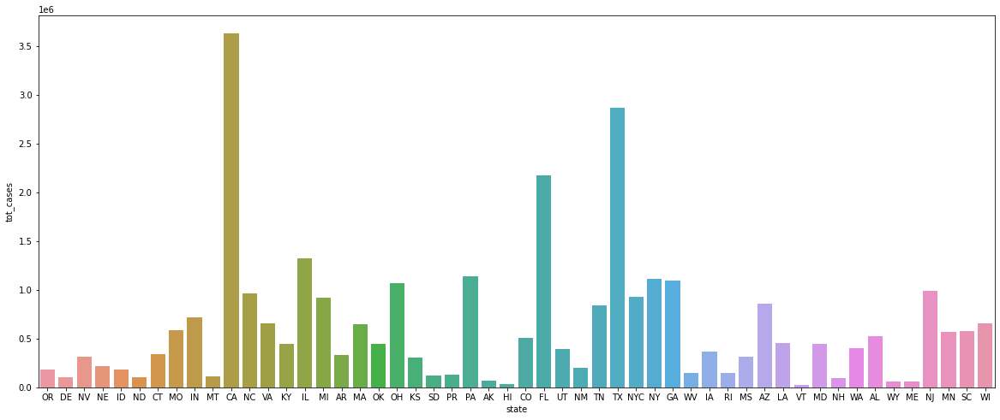

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x= 'state',y='tot_cases',data=cases)

**Observation**: California, Texas and Florida are top 3 states in covid cases.Vermont has lowest covid cases with 22416 cases



###**Total Deaths**

In [ ]:
for t in range(0,51) :
  print("Total Deaths in "+Total_cases['state'][t]+" are " + str(Total_cases['tot_death'][t]))

Total Deaths in OR are 2486.0
Total Deaths in DE are 1617.0
Total Deaths in NV are 5433.0
Total Deaths in NE are 2242.0
Total Deaths in ID are 2034.0
Total Deaths in ND are 1486.0
Total Deaths in CT are 8066.0
Total Deaths in MO are 8732.0
Total Deaths in IN are 13280.0
Total Deaths in MT are 1563.0
Total Deaths in CA are 60203.0
Total Deaths in NC are 12560.0
Total Deaths in VA are 10724.0
Total Deaths in KY are 6459.0
Total Deaths in IL are 24150.0
Total Deaths in MI are 18446.0
Total Deaths in AR are 5720.0
Total Deaths in MA are 17419.0
Total Deaths in OK are 6790.0
Total Deaths in OH are 19122.0
Total Deaths in KS are 4970.0
Total Deaths in SD are 1960.0
Total Deaths in PR are 2279.0
Total Deaths in PA are 25988.0
Total Deaths in AK are 341.0
Total Deaths in HI are 475.0
Total Deaths in CO are 6255.0
Total Deaths in FL are 34912.0
Total Deaths in UT are 2183.0
Total Deaths in NM are 4027.0
Total Deaths in TN are 12152.0
Total Deaths in TX are 48973.0
Total Deaths in NYC are 32434.

In [ ]:
import datetime
cumulative_df = data.groupby(["state", "submission_date"])["tot_cases", "tot_death"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 4, 30)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.choropleth(locations=cumulative_df["state"],
                    color=cumulative_df["tot_death"], 
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame=cumulative_df["submission_date"],
                    color_continuous_scale='Reds',
                    range_color=[0,60000]
                    #autocolorscale=False,
                   )
layout = go.Layout(
    title=go.layout.Title(
        text="Cumulative count of COVID-19 Deaths in US states",
        x=0.5
    ),
    font=dict(size=14),
)

fig.update_layout(layout)
fig.show()

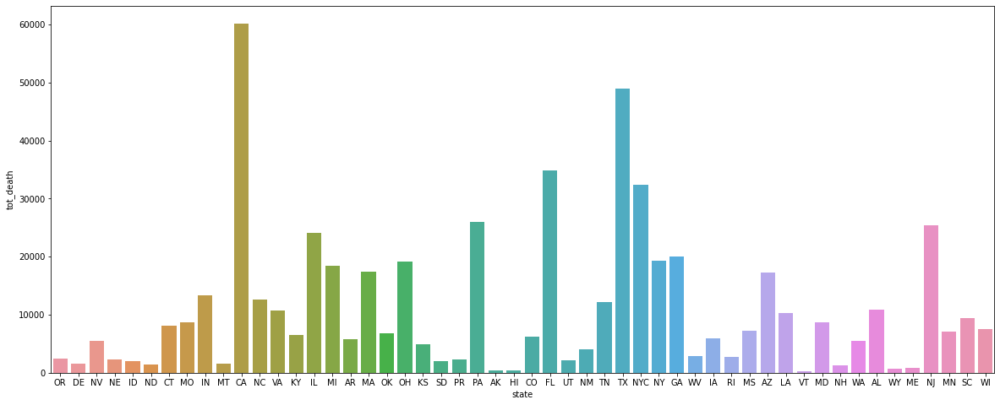

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='tot_death',data=cases)

**Observation**: California, Texas and Florida are top 3 states in covid deaths.Vermont has lowest covid cases with 243 deaths



In [ ]:
#state with highest cases and death in USA

high_cases = cases.sort_values(by = ['tot_cases'],ascending=False)
#display(cases)
print("State with highest covid-19 cases is", high_cases['state'].iloc[0],"with",high_cases['tot_cases'].iloc[0],"cases")

high_cases = cases.sort_values(by= ['tot_death'], ascending=False)
print("State with highest covid-19 deaths is", high_cases['state'].iloc[0],"with",high_cases['tot_death'].iloc[0],"cases")



State with highest covid-19 cases is CA with 3631740.0 cases
State with highest covid-19 deaths is CA with 60203.0 cases


In [ ]:
#state with low cases and deaths in USA
low_cases = cases.sort_values(by = ['tot_cases'],ascending=True)
#display(low_cases)
print("State with lowest covid-19 cases is", low_cases['state'].iloc[0],"with",low_cases['tot_cases'].iloc[0],"cases")

low_cases = cases.sort_values(by=['tot_death'],ascending=True)
print("State with lowest covid-19 deaths is", low_cases['state'].iloc[0],"with",low_cases['tot_death'].iloc[0],"deaths")

State with lowest covid-19 cases is VT with 22617.0 cases
State with lowest covid-19 deaths is VT with 244.0 deaths


In [ ]:
cumulative_df = data.groupby(["state", "submission_date"])["tot_cases", "tot_death"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 4, 30)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.scatter(cumulative_df, x="tot_cases", y="tot_death", animation_frame="submission_date", animation_group="state",
           size="tot_cases", color="state", hover_name="state",
           log_x=False, size_max=55, range_x=[0,3800000], range_y=[0,80000])

layout = go.Layout(
    title=go.layout.Title(
        text="Changes in number of cases & death  over time in US states",
        x=0.5
    ),
    font=dict(size=14),
    xaxis_title = "Total number of  cases",
    yaxis_title = "Total number of death"
)

fig.update_layout(layout)

fig.show()

**Observation:** In the above layout we analysed changes in number of cases and deaths over time in USA states. As we can see California, Texas and Florida are the top states in covid cases and deaths.

###**Monthly Cases and Deaths**

In [ ]:
df = pd.DataFrame(data=data)
df['submission_date'] = pd.to_datetime(df["submission_date"].dt.strftime('%Y-%B')) 
display(df.sort_values(by=['submission_date'], ascending=False).head())

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
22978,2021-04-01,MD,431795.000,0.000,0.000,1444.000,0.000,8512.000,8326.000,186.000,19.000,0.000,04/15/2021 01:58:27 PM,Not agree,Agree
16143,2021-04-01,OK,443223.000,349796.000,93427.000,418.000,126.000,6694.000,5665.000,1029.000,3.000,0.000,04/10/2021 01:45:46 PM,Agree,Agree
16144,2021-04-01,UT,392509.000,392509.000,0.000,413.000,0.000,2164.000,2103.000,61.000,0.000,0.000,04/18/2021 01:41:35 PM,Agree,Agree
20007,2021-04-01,WA,377952.000,0.000,0.000,488.000,76.000,5329.000,0.000,0.000,7.000,0.000,04/13/2021 02:00:37 PM,Not agree,Not agree
4578,2021-04-01,DE,101547.000,94916.000,6631.000,389.000,32.000,1602.000,1461.000,141.000,0.000,0.000,04/20/2021 02:59:01 PM,Agree,Agree


In [ ]:
first_case = df.loc[(df['tot_cases']>=1)]
display(first_case.sort_values(by=['submission_date'],ascending=True).head())


,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
657,2020-01-01,IL,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,03/26/2020 04:22:39 PM,Agree,Agree
2209,2020-01-01,WA,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,03/26/2020 04:22:39 PM,Not agree,Not agree
7616,2020-01-01,AZ,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,03/26/2020 04:22:39 PM,Agree,Agree
27348,2020-01-01,IL,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,03/26/2020 04:22:39 PM,Agree,Agree
23367,2020-01-01,IL,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,03/26/2020 04:22:39 PM,Agree,Agree


Total cases in Jan 2020 : 7.0
Total cases in Feb 2020 : 47.0
Total cases in Mar 2020 : 187540.0
Total cases in April 2020 : 871996.0
Total cases in May 2020 : 720660.0
Total cases in June 2020 : 846174.0
Total cases in July 2020 : 1922181.0
Total cases in Aug 2020 : 1466530.0
Total cases in Sep 2020 : 1214810.0
Total cases in Oct 2020 : 1923888.0
Total cases in Nov 2020 : 4393610.0
Total cases in Dec 2020 : 6387454.0
Total cases in Jan 2021 : 6090209.0
Total cases in Feb 2021 : 2350441.0
Total cases in Mar 2021 : 1769458.0
Total cases in April 2021 : 1638511.0


[Text(0, 0, 'Jan 2020'),
 Text(0, 0, 'Feb 2020'),
 Text(0, 0, 'Mar 2020'),
 Text(0, 0, 'Apr 2020'),
 Text(0, 0, 'May 2020'),
 Text(0, 0, 'Jun 2020'),
 Text(0, 0, 'Jul 2020'),
 Text(0, 0, 'Aug 2020'),
 Text(0, 0, 'Sep 2020'),
 Text(0, 0, 'Oct 2020'),
 Text(0, 0, 'Nov 2020'),
 Text(0, 0, 'Dec 2020'),
 Text(0, 0, 'Jan 2021'),
 Text(0, 0, 'Feb 2021'),
 Text(0, 0, 'Mar 2021'),
 Text(0, 0, 'April 2021')]

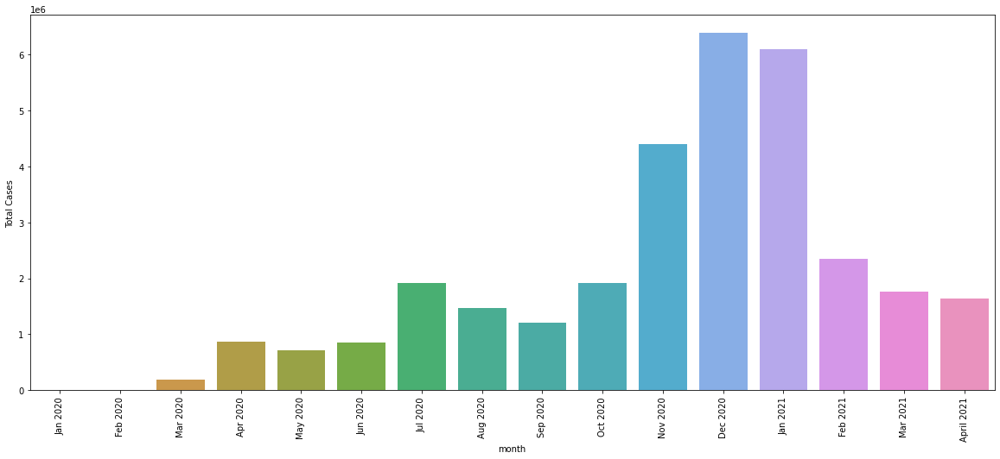

In [ ]:
#Monthly cases in USA

monthly_cases = first_case.loc[(df['submission_date'] =='2020-01-01')]
print("Total cases in Jan 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Jan 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df = pd.DataFrame(data=d)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-02-01')]
print("Total cases in Feb 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Feb 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-03-01')]
print("Total cases in Mar 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Mar 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-04-01')]
print("Total cases in April 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Apr 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-05-01')]
print("Total cases in May 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['May 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-06-01')]
print("Total cases in June 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Jun 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-07-01')]
print("Total cases in July 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Jul 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-08-01')]
print("Total cases in Aug 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Aug 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-09-01')]
print("Total cases in Sep 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Sep 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-10-01')]
print("Total cases in Oct 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Oct 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-11-01')]
print("Total cases in Nov 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Nov 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-12-01')]
print("Total cases in Dec 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Dec 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-01-01')]
print("Total cases in Jan 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['Jan 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-02-01')]
print("Total cases in Feb 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['Feb 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-03-01')]
print("Total cases in Mar 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['Mar 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-04-01')]
print("Total cases in April 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['April 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

plt.figure(figsize=(20,8))
p = sns.barplot(y='Total Cases' , x='month', data=total_cases_df )
#x_dates = first_case['submission_date'].dt.strftime('%Y-%m-%d').sort_values().unique()
p.set_xticklabels(p.get_xticklabels(),rotation=90)


**Observation**: As per above chart December 2020 has recorded highest covid cases with 6,387,454 cases in USA 

Total deaths in Jan 2020 : 0.0
Total deaths in Feb 2020 : 1.0
Total deaths in Mar 2020 : 3669.0
Total deaths in April 2020 : 54783.0
Total deaths in May 2020 : 41809.0
Total deaths in June 2020 : 21549.0
Total deaths in July 2020 : 28213.0
Total deaths in Aug 2020 : 29147.0
Total deaths in Sep 2020 : 22266.0
Total deaths in Oct 2020 : 23962.0
Total deaths in Nov 2020 : 39328.0
Total deaths in Dec 2020 : 79074.0
Total deaths in Jan 2021 : 96959.0
Total deaths in Feb 2021 : 63325.0
Total deaths in Mar 2021 : 32989.0
Total deaths in April 2021 : 17378.0


[Text(0, 0, 'Jan 2020'),
 Text(0, 0, 'Feb 2020'),
 Text(0, 0, 'Mar 2020'),
 Text(0, 0, 'Apr 2020'),
 Text(0, 0, 'May 2020'),
 Text(0, 0, 'Jun 2020'),
 Text(0, 0, 'Jul 2020'),
 Text(0, 0, 'Aug 2020'),
 Text(0, 0, 'Sep 2020'),
 Text(0, 0, 'Oct 2020'),
 Text(0, 0, 'Nov 2020'),
 Text(0, 0, 'Dec 2020'),
 Text(0, 0, 'Jan 2021'),
 Text(0, 0, 'Feb 2021'),
 Text(0, 0, 'Mar 2021'),
 Text(0, 0, 'April 2021')]

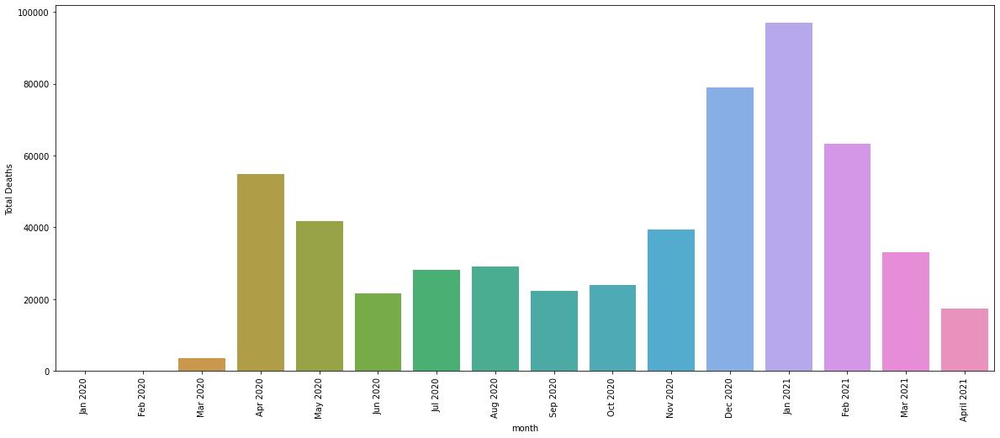

In [ ]:
#Monthly deaths in USA
monthly_deaths = first_case.loc[(df['submission_date'] =='2020-01-01')]
print("Total deaths in Jan 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jan 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df = pd.DataFrame(data=d)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-02-01')]
print("Total deaths in Feb 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Feb 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-03-01')]
print("Total deaths in Mar 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Mar 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-04-01')]
print("Total deaths in April 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Apr 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-05-01')]
print("Total deaths in May 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['May 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-06-01')]
print("Total deaths in June 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jun 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-07-01')]
print("Total deaths in July 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jul 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-08-01')]
print("Total deaths in Aug 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Aug 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-09-01')]
print("Total deaths in Sep 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Sep 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-10-01')]
print("Total deaths in Oct 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Oct 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-11-01')]
print("Total deaths in Nov 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Nov 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-12-01')]
print("Total deaths in Dec 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Dec 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-01-01')]
print("Total deaths in Jan 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jan 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-02-01')]
print("Total deaths in Feb 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['Feb 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-03-01')]
print("Total deaths in Mar 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['Mar 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-04-01')]
print("Total deaths in April 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['April 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

plt.figure(figsize=(20,8))
p = sns.barplot(y='Total Deaths' , x='month', data=total_deaths_df )
#x_dates = first_case['submission_date'].dt.strftime('%Y-%m-%d').sort_values().unique()
p.set_xticklabels(p.get_xticklabels(),rotation=90)

**Observation**: As per above chart January 2021 has recorded highest covid deaths with 96,959 deaths in USA 

# **Probable Cases**

**A probable case or death is defined as any one of the following:**

**Meets clinical criteria AND epidemiologic linkage with no confirmatory laboratory testing performed for SARS-CoV-2.** 

**Meets presumptive laboratory evidence.**

**Meets vital records criteria with no confirmatory laboratory evidence for SARS-CoV-2.** 

As of April 14, 2020, CDC case counts and death counts include both confirmed and probable cases and deaths. This change was made to reflect an interim COVID-19 position statement issued by the Council for State and Territorial Epidemiologists on April 5, 2020. The position statement included a case definition and made COVID-19 a nationally notifiable disease. Nationally notifiable disease cases are voluntarily reported to CDC by jurisdictions. 

 Not all jurisdictions report probable cases and deaths to CDC. When not available to CDC, it is noted as N/A. Please note that jurisdictions may reclassify probable cases at any time to confirmed cases (if confirmatory laboratory evidence is obtained) or withdraw probable case reports entirely if further public health investigation determines that the individual most likely did not have COVID-19. As a result, probable case counts can fluctuate substantially. A jurisdiction might even report a negative number of probable cases on a given day, if more probable cases were disproven than were initially reported on that day.

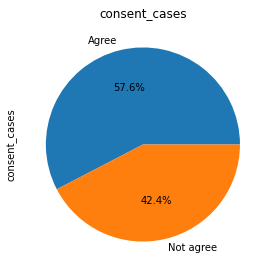

In [ ]:
plt.figure(figsize=(20,8))
plt.subplot(141)
plt.title('consent_cases')
data['consent_cases'].value_counts().plot.pie(autopct="%1.1f%%")

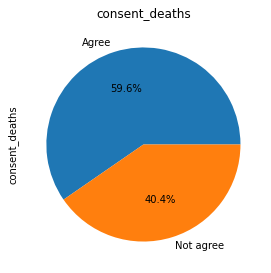

In [ ]:
plt.figure(figsize=(20,8))
plt.subplot(141)
plt.title('consent_deaths')
data['consent_deaths'].value_counts().plot.pie(autopct="%1.1f%%")

###**Probable Cases**

In [ ]:
probable_cases = cases.loc[(df['consent_cases'] =='Agree')]
display(probable_cases.dropna().reset_index(drop = True).head())
updated=probable_cases.dropna().reset_index(drop = True)


,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-04-26,OR,181321.000,181321.000,0.000,621.000,0.000,2486.000,2486.000,0.000,1.000,0.000,04/27/2021 01:56:18 PM,Agree,Agree
1,2021-04-26,DE,103459.000,96584.000,6875.000,237.000,21.000,1617.000,1476.000,141.000,1.000,0.000,04/27/2021 01:56:18 PM,Agree,Agree
2,2021-04-26,ID,186725.000,149701.000,37024.000,360.000,137.000,2034.000,1773.000,261.000,2.000,0.000,04/27/2021 01:56:18 PM,Agree,Agree
3,2021-04-26,ND,106998.000,99017.000,7981.000,189.000,102.000,1486.000,0.000,0.000,0.000,0.000,04/27/2021 01:56:18 PM,Agree,Not agree
4,2021-04-26,CT,336933.000,309342.000,27591.000,723.000,429.000,8066.000,6633.000,1433.000,19.000,3.000,04/27/2021 01:56:18 PM,Agree,Agree


In [ ]:
for i in range(0,30) :
   print("Total Number of Probable Cases in "+updated['state'][i]+" are " + str(updated['prob_cases'][i]))

Total Number of Probable Cases in OR are 0.0
Total Number of Probable Cases in DE are 6875.0
Total Number of Probable Cases in ID are 37024.0
Total Number of Probable Cases in ND are 7981.0
Total Number of Probable Cases in CT are 27591.0
Total Number of Probable Cases in MT are 9081.0
Total Number of Probable Cases in NC are 137205.0
Total Number of Probable Cases in VA are 145962.0
Total Number of Probable Cases in KY are 107374.0
Total Number of Probable Cases in IL are 0.0
Total Number of Probable Cases in MI are 93036.0
Total Number of Probable Cases in MA are 9896.0
Total Number of Probable Cases in OK are 94320.0
Total Number of Probable Cases in OH are 169065.0
Total Number of Probable Cases in KS are 59061.0
Total Number of Probable Cases in PR are 15460.0
Total Number of Probable Cases in PA are 178086.0
Total Number of Probable Cases in CO are 32229.0
Total Number of Probable Cases in UT are 0.0
Total Number of Probable Cases in TN are 145948.0
Total Number of Probable Cases

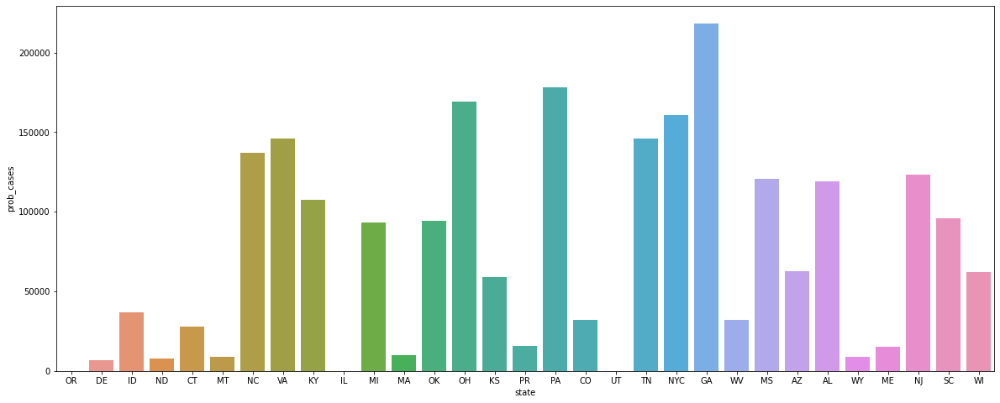

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='prob_cases',data=updated)

**Observation:** Georgia has the highest number of probable cases with 217,670 cases.

# **Probable Deaths**

In [ ]:
probabledeath = cases.loc[(df['consent_deaths'] =='Agree')]
#display(probabledeath.dropna().reset_index(drop = True))
probable_death=probabledeath.dropna().reset_index(drop = True)
for i in range(0,30) :
   print("Total Number of Probable Deaths in "+probable_death['state'][i]+" are " + str(probable_death['prob_death'][i]))

Total Number of Probable Deaths in OR are 0.0
Total Number of Probable Deaths in DE are 141.0
Total Number of Probable Deaths in ID are 261.0
Total Number of Probable Deaths in CT are 1433.0
Total Number of Probable Deaths in IN are 410.0
Total Number of Probable Deaths in MT are 0.0
Total Number of Probable Deaths in NC are 1483.0
Total Number of Probable Deaths in VA are 1714.0
Total Number of Probable Deaths in KY are 630.0
Total Number of Probable Deaths in IL are 2314.0
Total Number of Probable Deaths in MI are 1122.0
Total Number of Probable Deaths in MA are 208.0
Total Number of Probable Deaths in OK are 1029.0
Total Number of Probable Deaths in OH are 0.0
Total Number of Probable Deaths in SD are 365.0
Total Number of Probable Deaths in PR are 333.0
Total Number of Probable Deaths in CO are 750.0
Total Number of Probable Deaths in UT are 64.0
Total Number of Probable Deaths in TN are 2396.0
Total Number of Probable Deaths in NYC are 5090.0
Total Number of Probable Deaths in GA 

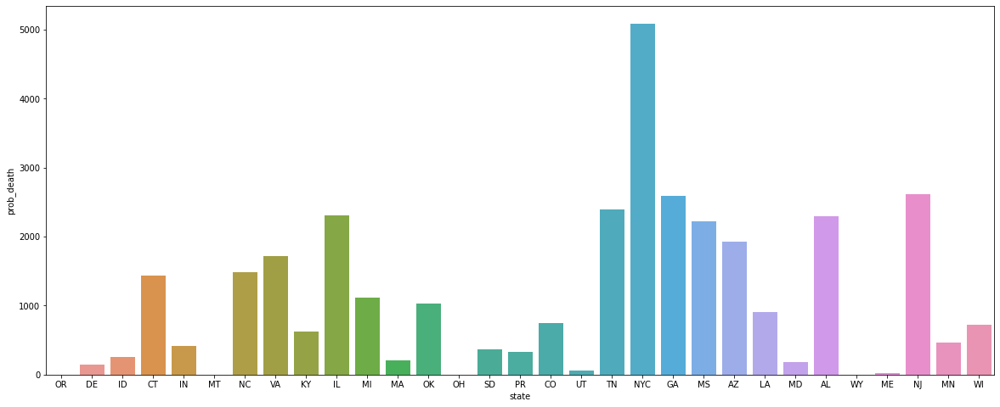

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='prob_death',data=probable_death)

**Observation:** New york city has the highest number of probable deaths with 5090 deaths due to covid-19.

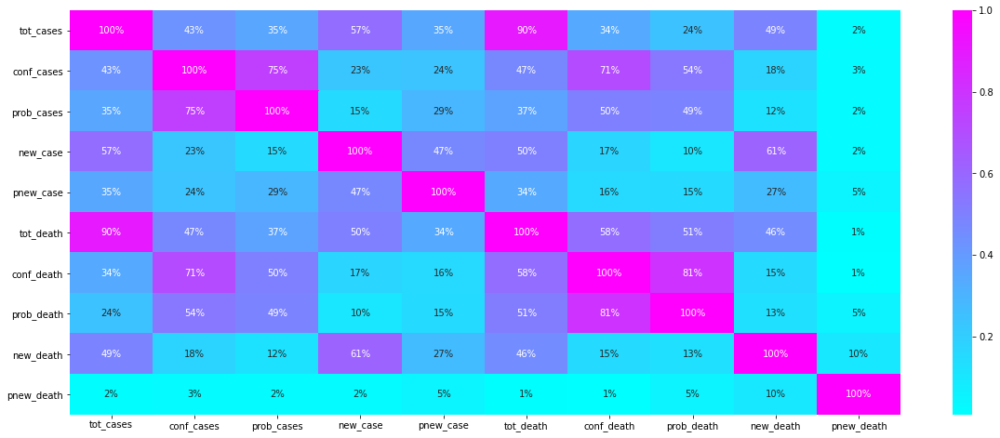

In [ ]:
plt.figure(figsize=(20,8))
sns.heatmap(data.corr(),annot=True, fmt='.0%',cmap='cool')
plt.show()

#**Total and Average Recovery Cases of Covid_19 in USA**

In [ ]:
# convert objects to float
data["tot_cases"] =  data.tot_cases.astype(float)
data["tot_death"] = data.tot_death.astype(float)
data = data[["submission_date", "state", "tot_cases", "tot_death"]]
state_df = data.groupby('state').mean().reset_index()
state_df.tail()
data["Total_recovered"] = data.tot_cases - data.tot_death
data.tail()


,submission_date,state,tot_cases,tot_death,Total_recovered
27654,2020-08-03,ND,6933.000,107.000,6826.000
27656,2020-07-21,MO,45475.000,1143.000,44332.000
27657,2021-02-24,AL,490220.000,9744.000,480476.000
27658,2020-05-17,MN,16372.000,739.000,15633.000
27659,2020-07-20,NH,6249.000,398.000,5851.000


In [ ]:
covid_monthly_df = round(data.groupby(["submission_date", "state"]).mean().reset_index(), 2)
covid_monthly_df.tail()

,submission_date,state,tot_cases,tot_death,Total_recovered
23967,2021-04-26,VT,22617.000,244.000,22373.000
23968,2021-04-26,WA,397417.000,5450.000,391967.000
23969,2021-04-26,WI,656932.000,7473.000,649459.000
23970,2021-04-26,WV,151671.000,2821.000,148850.000
23971,2021-04-26,WY,57818.000,705.000,57113.000


In [ ]:
import datetime

cumulative_df = covid_monthly_df.groupby(["state", "submission_date"])["tot_cases", "tot_death", "Total_recovered"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 2, 25)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.choropleth(locations=cumulative_df["state"],
                    color=cumulative_df["Total_recovered"], 
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame=cumulative_df["submission_date"],
                    color_continuous_scale='greens',
                    range_color=[0,3800000]
                    #autocolorscale=False,
                   )

layout = go.Layout(
    title=go.layout.Title(
        text="Cumulative count of COVID-19 recovered cases in US states",
        x=0.5
    ),
    font=dict(size=14),
)

fig.update_layout(layout)
fig.show()

In [ ]:
covid_monthly_df = covid_monthly_df.rename(columns={"date": "Date", "state": "State", "tot_cases": "Average_cases", "tot_death": "Average_death", "Total_recovered": "Average_recovery"})
covid_monthly_df

,submission_date,State,Average_cases,Average_death,Average_recovery
0,2020-01-22,AK,0.0,0.0,0.0
1,2020-01-22,AL,0.0,0.0,0.0
2,2020-01-22,AR,0.0,0.0,0.0
3,2020-01-22,AZ,0.0,0.0,0.0
4,2020-01-22,CA,0.0,0.0,0.0
...,...,...,...,...,...
23967,2021-04-26,VT,22617.0,244.0,22373.0
23968,2021-04-26,WA,397417.0,5450.0,391967.0
23969,2021-04-26,WI,656932.0,7473.0,649459.0
23970,2021-04-26,WV,151671.0,2821.0,148850.0


In [ ]:
covid_monthly_df['Death_percent'] = round((covid_monthly_df.Average_death/covid_monthly_df.Average_cases)*100, 2)
covid_monthly_df['Recovery_percent'] = round((covid_monthly_df.Average_recovery/covid_monthly_df.Average_cases)*100, 2)
covid_monthly_df=covid_monthly_df.fillna(0)
covid_monthly_df

,submission_date,State,Average_cases,Average_death,Average_recovery,Death_percent,Recovery_percent
0,2020-01-22,AK,0.0,0.0,0.0,0.00,0.00
1,2020-01-22,AL,0.0,0.0,0.0,0.00,0.00
2,2020-01-22,AR,0.0,0.0,0.0,0.00,0.00
3,2020-01-22,AZ,0.0,0.0,0.0,0.00,0.00
4,2020-01-22,CA,0.0,0.0,0.0,0.00,0.00
...,...,...,...,...,...,...,...
23967,2021-04-26,VT,22617.0,244.0,22373.0,1.08,98.92
23968,2021-04-26,WA,397417.0,5450.0,391967.0,1.37,98.63
23969,2021-04-26,WI,656932.0,7473.0,649459.0,1.14,98.86
23970,2021-04-26,WV,151671.0,2821.0,148850.0,1.86,98.14


In [ ]:
average = covid_monthly_df.loc[(covid_monthly_df['submission_date'] =='2021-04-26')]
display(average.reset_index(drop=True).head())

,submission_date,state,tot_cases,tot_death,Total_recovered
0,2021-04-26,AK,64786.000,341.000,64445.000
1,2021-04-26,AL,526348.000,10852.000,515496.000
2,2021-04-26,AR,334769.000,5720.000,329049.000
3,2021-04-26,AZ,859487.000,17268.000,842219.000
4,2021-04-26,CA,3631740.000,60203.000,3571537.000


In [ ]:
#average.drop('submission_date',axis=1,inplace=True)
avg=average.reset_index(drop=True)
avg= avg.set_axis(avg['state'], axis=0)
avg.head()

,submission_date,state,tot_cases,tot_death,Total_recovered
state,,,,,
AK,2021-04-26,AK,64786.000,341.000,64445.000
AL,2021-04-26,AL,526348.000,10852.000,515496.000
AR,2021-04-26,AR,334769.000,5720.000,329049.000
AZ,2021-04-26,AZ,859487.000,17268.000,842219.000
CA,2021-04-26,CA,3631740.000,60203.000,3571537.000


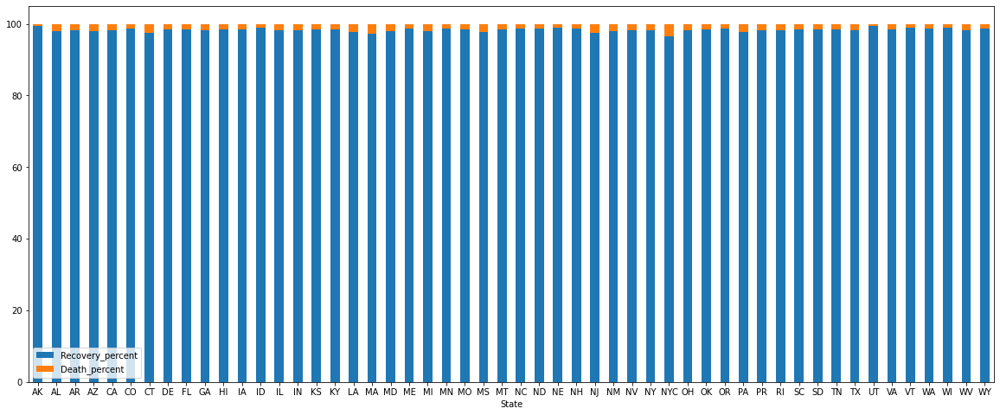

In [ ]:
df = avg.loc[:,["Recovery_percent","Death_percent"]]
ax = df.plot.bar(rot=0,figsize=(20,8),stacked=True)
#ax.figure()

**Observation:** New york city has the highest death percent with 3.52% and Alaska has highest recovery percent with 99.49%


In [ ]:
pip install pmdarima

#**Prediction of Covid_19 Cases and Deaths in  USA**

Prediction of Covid-19 Cases and Deaths is done by using Prophet Method.The Prophet library is an open-source library designed for making forecasts for univariate time series datasets. It is easy to use and designed to automatically find a good set of hyperparameters for the model in an effort to make skillful forecasts for data with trends and seasonal structure by default.

##**Cases Prediction**

In [ ]:
from fbprophet import Prophet
confirmed = data.groupby(['state','submission_date']).sum()['tot_cases'].reset_index()
deaths = data.groupby(['state','submission_date']).sum()['tot_death'].reset_index()

In [ ]:
# Create a common model for all cases.
def prediction(pred,x):
  m = Prophet(interval_width=0.95) 
  m.fit(pred) 
  future = m.make_future_dataframe(periods=x) 
  forecast = m.predict(future)
  confirmed_forecast_plot = m.plot(forecast)
  confirmed_forecast_plot =m.plot_components(forecast)
  return forecast

The name ‘ds‘ and contain the date-times.

The name ‘y‘ and contain the observations.

In [ ]:
confirmed.columns = ['state','ds','y']
confirmed['ds'] = pd.to_datetime(confirmed['ds'])
confirmed.tail()

,state,ds,y
23967,WY,2021-04-22,57613.0
23968,WY,2021-04-23,57696.0
23969,WY,2021-04-24,57737.0
23970,WY,2021-04-25,57778.0
23971,WY,2021-04-26,57818.0


###**Next 1 months New_cases prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


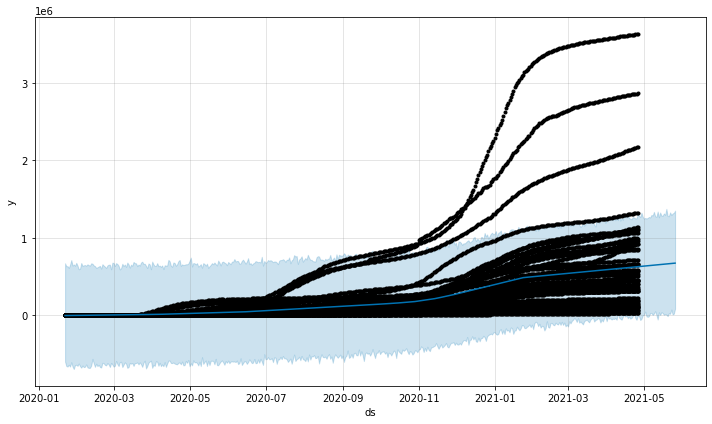

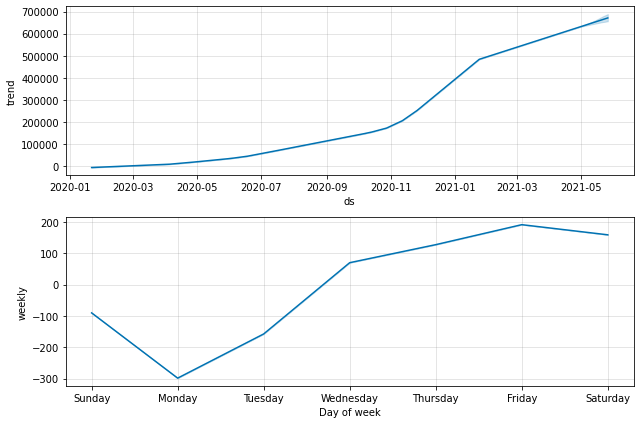

In [ ]:
f=prediction(confirmed,30)

In the above chart we can observe the Monthly, weekly and daily rise of covid cases for the next 30 days.

The result of the predict() function is a DataFrame that contains many columns. Perhaps the most important columns are the forecast date time (‘ds‘), the forecasted value (‘yhat‘), and the lower and upper bounds on the predicted value (‘yhat_lower‘ and ‘yhat_upper‘) that provide uncertainty of the forecast.

According to the data we are going to rename the columns "ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max" 

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max"},inplace=True)
f[['date', 'new_cases', 'new_cases_min', 'new_cases_max']].tail(10)

,date,new_cases,new_cases_min,new_cases_max
481,2021-05-17,657017.240838,3348.993771,1.313945e+06
482,2021-05-18,658694.256156,11342.207970,1.295417e+06
483,2021-05-19,660457.629886,5155.394321,1.372927e+06
484,2021-05-20,662051.235001,-13832.814252,1.280752e+06
485,2021-05-21,663651.104350,23481.084098,1.277990e+06
486,2021-05-22,665154.908912,15798.627899,1.327952e+06
487,2021-05-23,666442.123161,70751.986283,1.292522e+06
488,2021-05-24,667770.210133,7698.704682,1.313601e+06
489,2021-05-25,669447.225452,17544.117990,1.320817e+06
490,2021-05-26,671210.599181,83574.505697,1.350211e+06


###**Next 3 months New_cases prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


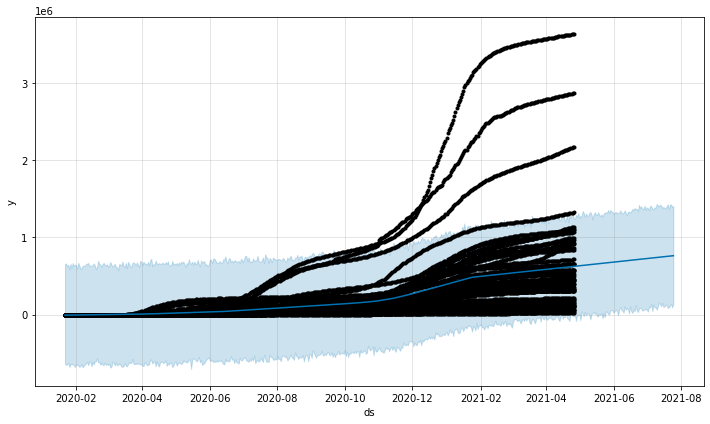

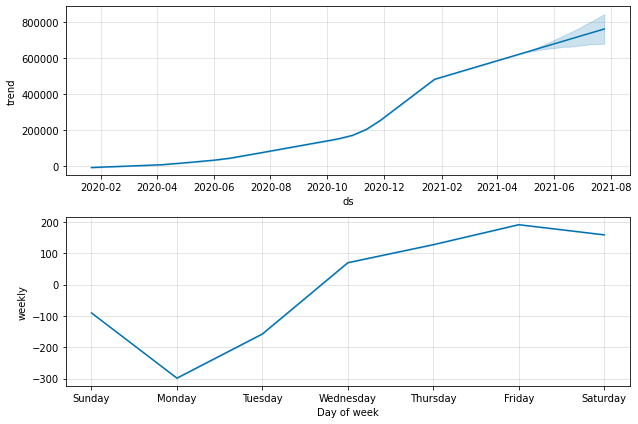

In [ ]:
f=prediction(confirmed,90)

In the above chart we can observe the Monthly, weekly and daily rise of covid cases for the next 90 days.

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max"},inplace=True)
f[['date', 'new_cases', 'new_cases_min', 'new_cases_max']].tail(10)

,date,new_cases,new_cases_min,new_cases_max
541,2021-07-16,749674.858711,100644.167367,1.394820e+06
542,2021-07-17,751178.663273,105077.709868,1.382632e+06
543,2021-07-18,752465.877522,132461.821488,1.373200e+06
544,2021-07-19,753793.964495,120207.405819,1.406433e+06
545,2021-07-20,755470.979813,85152.122811,1.427351e+06
546,2021-07-21,757234.353542,98196.278635,1.368183e+06
547,2021-07-22,758827.958658,112988.355161,1.426104e+06
548,2021-07-23,760427.828006,143043.367217,1.424831e+06
549,2021-07-24,761931.632568,94772.138812,1.391023e+06
550,2021-07-25,763218.846817,139657.706835,1.407087e+06


###**Next 6 months New_case prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


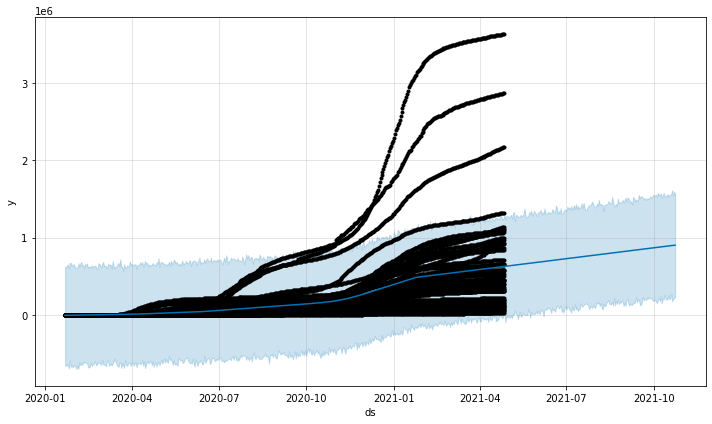

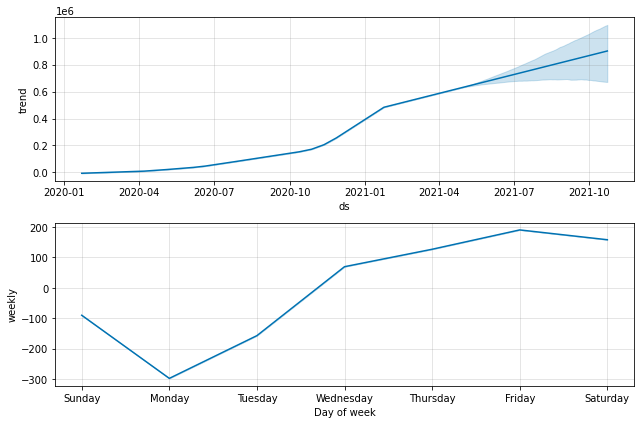

In [ ]:
f=prediction(confirmed,180)

In the above chart we can observe the Monthly, weekly and daily rise of covid cases for the next 180 days.

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max"},inplace=True)
f[['date', 'new_cases', 'new_cases_min', 'new_cases_max']].tail(10)

,date,new_cases,new_cases_min,new_cases_max
631,2021-10-14,887863.590199,196307.705534,1.540262e+06
632,2021-10-15,889463.459548,197657.367860,1.563810e+06
633,2021-10-16,890967.264110,256249.181498,1.525792e+06
634,2021-10-17,892254.478359,202864.527750,1.548851e+06
635,2021-10-18,893582.565331,209715.879728,1.549965e+06
636,2021-10-19,895259.580650,274750.193984,1.567216e+06
637,2021-10-20,897022.954379,175090.776520,1.614004e+06
638,2021-10-21,898616.559495,203260.873691,1.536441e+06
639,2021-10-22,900216.428843,220737.794482,1.594584e+06
640,2021-10-23,901720.233405,225800.942541,1.567794e+06


##**Deaths Prediction**

###**Next 1 months New_deaths prediction of COVID_19 in USA**

In [ ]:
deaths.columns = ['state','ds','y']
deaths['ds'] = pd.to_datetime(deaths['ds'])
deaths.tail()

,state,ds,y
23967,WY,2021-04-22,705.0
23968,WY,2021-04-23,705.0
23969,WY,2021-04-24,705.0
23970,WY,2021-04-25,705.0
23971,WY,2021-04-26,705.0


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


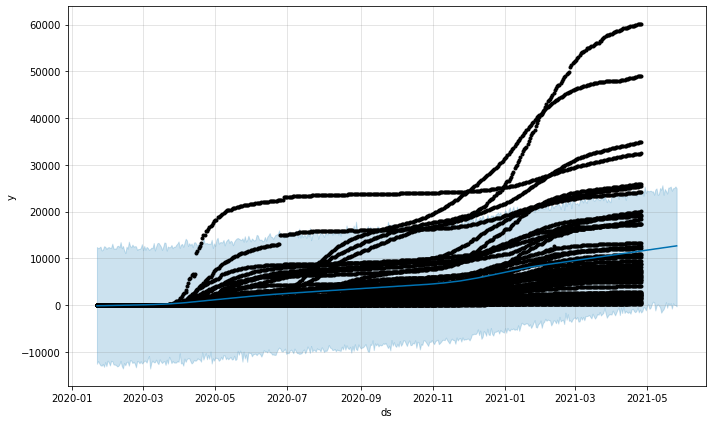

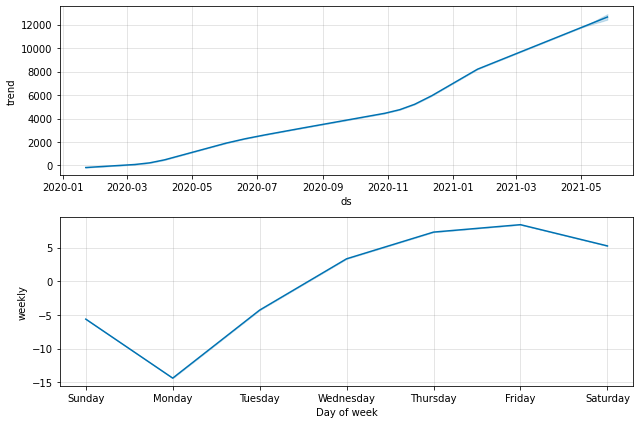

In [ ]:
f=prediction(deaths,30)

In the above chart we can observe the Monthly, weekly and daily rise of covid deaths for the next 30 days.

The result of the predict() function is a DataFrame that contains many columns. Perhaps the most important columns are the forecast date time (‘ds‘), the forecasted value (‘yhat‘), and the lower and upper bounds on the predicted value (‘yhat_lower‘ and ‘yhat_upper‘) that provide uncertainty of the forecast.

According to the data we are going to rename the columns "ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"},inplace=True)
f[['date', 'new_death', 'new_death_min', 'new_death_max']].tail(10)

,date,new_death,new_death_min,new_death_max
481,2021-05-17,12309.524041,593.699967,24392.270732
482,2021-05-18,12356.078317,-593.292442,23838.085859
483,2021-05-19,12400.148364,413.670518,25130.921387
484,2021-05-20,12440.562681,-67.869465,25141.841781
485,2021-05-21,12478.113615,386.148091,25338.087407
486,2021-05-22,12511.404961,-765.133284,24443.205087
487,2021-05-23,12536.973244,372.431767,24994.295012
488,2021-05-24,12564.651818,2.403824,25028.793981
489,2021-05-25,12611.206093,-6.129404,25371.870174
490,2021-05-26,12655.276140,-302.186181,24963.386874


###**Next 3 months New_deaths prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


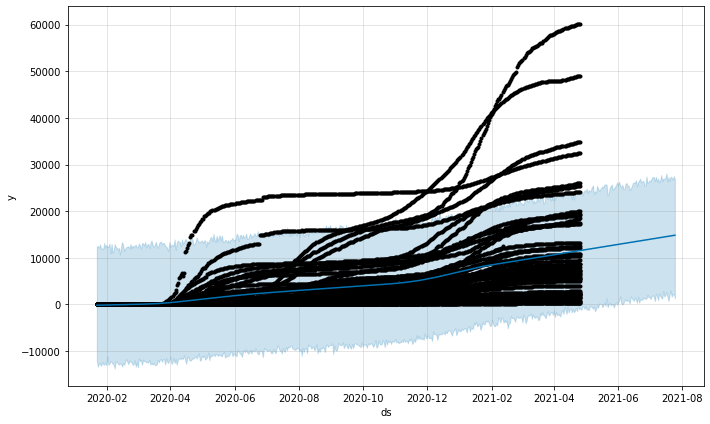

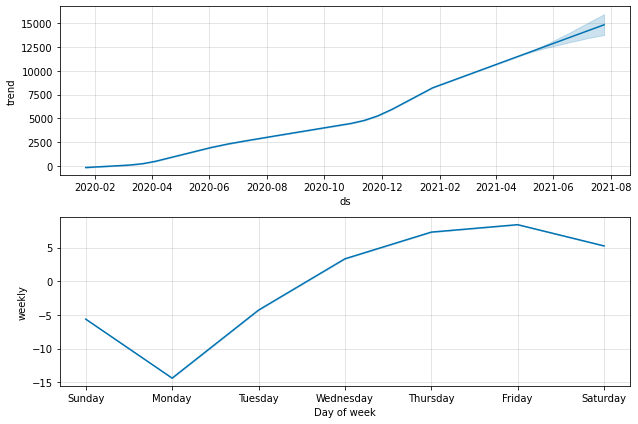

In [ ]:
f=prediction(deaths,90)

In the above chart we can observe the Monthly, weekly and daily rise of covid deaths for the next 90 days.

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"},inplace=True)
f[['date', 'new_death', 'new_death_min', 'new_death_max']].tail(10)

,date,new_death,new_death_min,new_death_max
541,2021-07-16,14519.135824,2026.241535,27101.955643
542,2021-07-17,14552.427170,2608.180940,28085.584755
543,2021-07-18,14577.995453,1627.253885,26353.706111
544,2021-07-19,14605.674027,757.977204,27303.308478
545,2021-07-20,14652.228302,2103.514350,26472.430960
546,2021-07-21,14696.298349,2952.856818,27390.920753
547,2021-07-22,14736.712666,1665.694871,27168.828287
548,2021-07-23,14774.263600,2253.955627,26754.373334
549,2021-07-24,14807.554946,2240.787511,27520.936725
550,2021-07-25,14833.123230,1293.253477,26882.108172


###**Next 6 months New_deaths prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


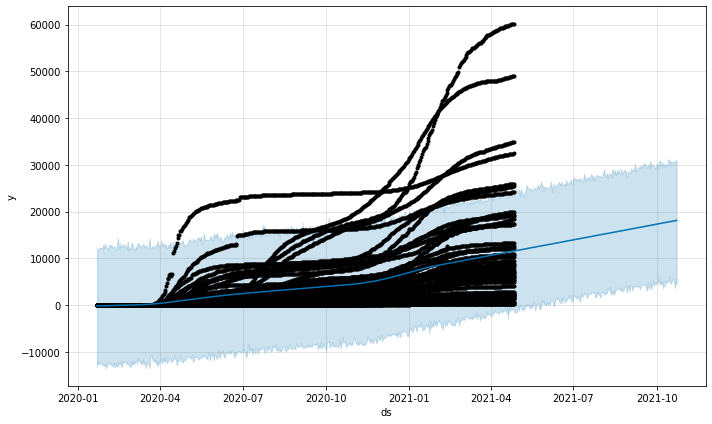

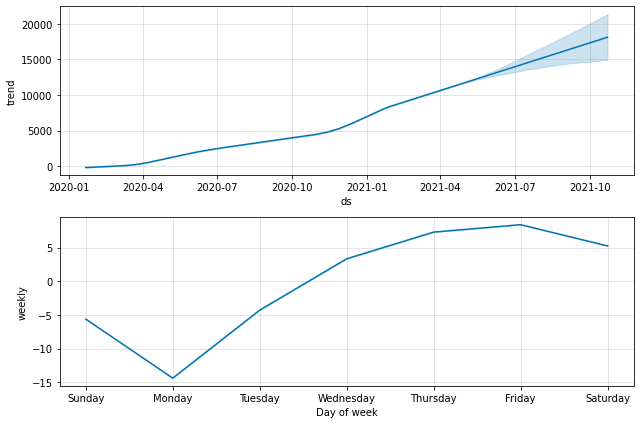

In [ ]:
f=prediction(deaths,180)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"},inplace=True)
f[['date', 'new_death', 'new_death_min', 'new_death_max']].tail(10)

,date,new_death,new_death_min,new_death_max
631,2021-10-14,17798.245980,4988.759913,31249.934059
632,2021-10-15,17835.796913,6206.795110,30908.373180
633,2021-10-16,17869.088259,4631.364983,30212.259991
634,2021-10-17,17894.656543,4736.441803,30853.069195
635,2021-10-18,17922.335116,5186.100225,30501.953628
636,2021-10-19,17968.889391,5717.792812,30439.336836
637,2021-10-20,18012.959439,5506.703684,30542.945146
638,2021-10-21,18053.373756,3619.913485,30850.093928
639,2021-10-22,18090.924690,5036.722092,30897.434876
640,2021-10-23,18124.216036,4502.529127,30891.989144


In the above chart we can observe the Monthly, weekly and daily rise of covid deaths for the next 180 days.

#**Demographics for COVID-19**

**About Data**

This case surveillance public use dataset has 12 elements for all COVID-19 cases shared with CDC and includes demographics, any exposure history, disease severity indicators and outcomes, presence of any underlying medical conditions and risk behaviors, and no geographic data.The datasets will include all cases with the earliest date available in each record (date received by CDC or date related to illness/specimen collection) at least 14 days prior to the creation of the previously updated datasets. This 14-day lag allows case reporting to be stabilized and ensures that time-dependent outcome data are accurately captured.

In [ ]:
import pandas as pd
df2 = pd.read_csv('https://data.cdc.gov/api/views/vbim-akqf/rows.csv?accessType=DOWNLOAD',",") 
pd.set_option('display.max_columns',None)
#print(dataset.columns.to_list(),'\n')
display(df2)

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn
0,2020/10/23,2021/01/28,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",Missing,Missing,No,Missing
1,2020/10/23,2020/10/23,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No
2,2020/10/23,2020/10/25,2020/10/23,2020/10/23,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing
3,2020/10/23,2020/10/25,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",Missing,Missing,Missing,Missing
4,2020/10/23,2020/10/26,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,No,Missing
...,...,...,...,...,...,...,...,...,...,...,...,...
22507134,2020/10/26,2020/12/12,2020/10/29,2020/10/26,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,No,Missing,Missing,No
22507135,2020/10/29,2020/11/01,2020/10/29,NaN,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,No,No,No
22507136,2020/10/28,2021/02/10,2020/10/29,2020/10/28,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,No,Missing,No,No
22507137,2020/10/29,2020/10/30,2020/10/29,2020/10/29,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,No,No,No,Missing


###**About the dataset features:**

**cdc_case_earliest_dt :** The earlier of the Clinical Date (date related to the illness or specimen collection) or the Date Received by CDC

**cdc_report_dt :**
Initial case report date to CDC. Deprecated, use new cdc_case_earliest_dt

**pos_spec_dt :** Date of first positive specimen collection

**onset_dt :** Symptom onset date, if symptomatic

**current_status Case Status:** Laboratory-confirmed case; Probable case

**Sex :**
 Male; Female; Unknown; Other

**Age Group :** 0 - 9 Years; 10 - 19 Years; 20 - 39 Years; 40 - 49 Years; 50 - 59 Years; 60 - 69 Years; 70 - 79 Years; 80 + Years

**race_ethnicity_combined :** Race and ethnicity (combined): Hispanic/Latino; American Indian / Alaska Native, Non-Hispanic; Asian, Non-Hispanic; Black, Non-Hispanic; Native Hawaiian / Other Pacific Islander, Non-Hispanic; White, Non-Hispanic; Multiple/Other, Non-Hispanic

**medcond_yn :**
Presence of underlying comorbidity or disease

#**Demographics**

In [ ]:
df2.shape

(22507139, 12)

In [ ]:
#To check unique values in each columns of the dataset
df2.nunique()

cdc_case_earliest_dt       441
cdc_report_dt              455
pos_spec_dt                449
onset_dt                   455
current_status               2
sex                          5
age_group                   10
race_ethnicity_combined      9
hosp_yn                      4
icu_yn                       4
death_yn                     4
medcond_yn                   4
dtype: int64

In [ ]:
df2=df2.dropna()

In [ ]:
df2['cdc_report_dt'] = pd.to_datetime(df2['cdc_report_dt'])
df2['pos_spec_dt'] = pd.to_datetime(df2['pos_spec_dt'])
df2['onset_dt'] = pd.to_datetime(df2['onset_dt'])

In [ ]:
df2['race_ethnicity_combined'].value_counts()

White, Non-Hispanic                                     1281207
Unknown                                                  583375
Hispanic/Latino                                          533661
Black, Non-Hispanic                                      232738
Multiple/Other, Non-Hispanic                              92004
Asian, Non-Hispanic                                       88707
American Indian/Alaska Native, Non-Hispanic               15972
Native Hawaiian/Other Pacific Islander, Non-Hispanic      15890
Missing                                                   12570
Name: race_ethnicity_combined, dtype: int64

In [ ]:
df2[df2['hosp_yn'] == 'Unknown']

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn
129,2020/10/20,2020-10-20,2020-10-23,2020-10-20,Laboratory-confirmed case,Female,0 - 9 Years,"White, Non-Hispanic",Unknown,Unknown,No,Unknown
142,2020/10/21,2021-02-13,2020-10-23,2020-10-21,Laboratory-confirmed case,Female,0 - 9 Years,"White, Non-Hispanic",Unknown,Missing,Missing,Missing
195,2020/10/23,2020-10-25,2020-10-23,2020-10-23,Laboratory-confirmed case,Male,0 - 9 Years,"Multiple/Other, Non-Hispanic",Unknown,Missing,Unknown,Missing
226,2020/10/22,2020-10-27,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,Hispanic/Latino,Unknown,Unknown,Unknown,Unknown
244,2020/10/10,2020-10-27,2020-10-23,2020-10-10,Laboratory-confirmed case,Female,0 - 9 Years,Hispanic/Latino,Unknown,Unknown,Unknown,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...
22507009,2020/10/27,2020-10-27,2020-10-29,2020-10-27,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,No,No
22507038,2020/08/11,2020-11-02,2020-10-29,2020-08-11,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,Unknown,Unknown
22507062,2020/10/23,2020-10-30,2020-10-29,2020-10-23,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,Unknown,Unknown
22507128,2020/08/29,2021-01-19,2020-10-29,2020-08-29,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,Unknown,Unknown


In [ ]:
df2['disease maturity'] = df2['onset_dt'] - df2['pos_spec_dt'] # for calulating the disase onset to maturity case

In [ ]:
df2.head()

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn,disease maturity
2,2020/10/23,2020-10-25,2020-10-23,2020-10-23,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing,0 days
5,2020/10/22,2020-10-25,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,No,Missing,-1 days
7,2020/10/21,2020-10-25,2020-10-23,2020-10-21,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing,-2 days
12,2020/10/22,2020-10-22,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No,-1 days
21,2020/10/22,2020-10-22,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No,-1 days


In [ ]:
df2['disease maturity'].describe()

count                        2856124
mean     -3 days +06:39:13.299506354
std       13 days 22:25:57.215341511
min              -396 days +00:00:00
25%                -4 days +00:00:00
50%                -2 days +00:00:00
75%                  0 days 00:00:00
max                369 days 00:00:00
Name: disease maturity, dtype: object

We can see that the mean is -3 days , which means symptoms set in after being tested positive. Sign of increasing awareness and people getting tested in advance. Also, Asymptomatics cases are to be factored in.

#**Analysis for Age Groups and how they are affected by the disease**

In [ ]:
df2.age_group.value_counts()

20 - 29 Years    550352
30 - 39 Years    481438
40 - 49 Years    437117
50 - 59 Years    403172
10 - 19 Years    326597
60 - 69 Years    285836
70 - 79 Years    150236
0 - 9 Years      127001
80+ Years         93855
Missing             520
Name: age_group, dtype: int64

In [ ]:
age_map = {'0 - 9 Years': 10,'10 - 19 Years':20,'20 - 29 Years':30,'30 - 39 Years':40,'40 - 49 Years':50,'50 - 59 Years':60,'60 - 69 Years':70,'70 - 79 Years':80,'80+ Years':90}
df2['age_group'] = df2['age_group'].map(age_map)
df2.age_group.describe()

count    2.855604e+06
mean     4.555623e+01
std      2.005966e+01
min      1.000000e+01
25%      3.000000e+01
50%      4.000000e+01
75%      6.000000e+01
max      9.000000e+01
Name: age_group, dtype: float64

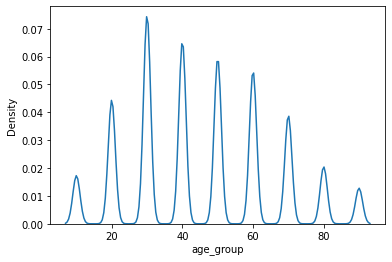

In [ ]:
sns.kdeplot(df2['age_group'])

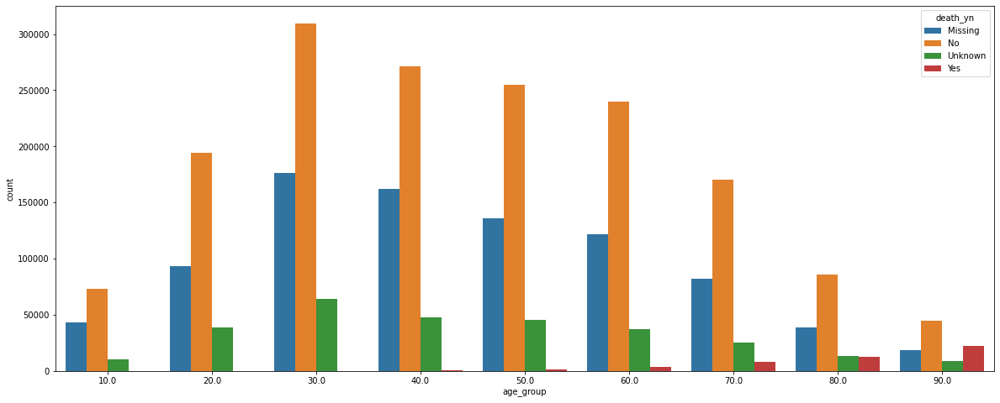

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(x=df2.age_group, hue=df2.death_yn)

**Observation:**Above bar chart shows that people who died due to covid-19 are above 80 years

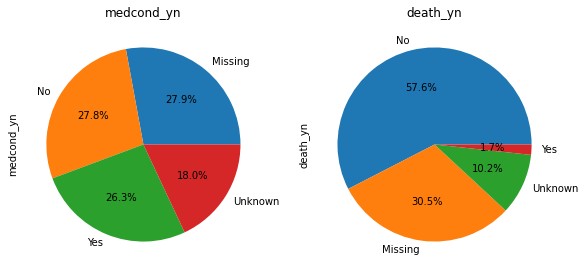

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('medcond_yn')
df2['medcond_yn'].value_counts().plot.pie(autopct="%1.1f%%")

plt.subplot(142)
plt.title('death_yn')
df2['death_yn'].value_counts().plot.pie(autopct="%1.1f%%")

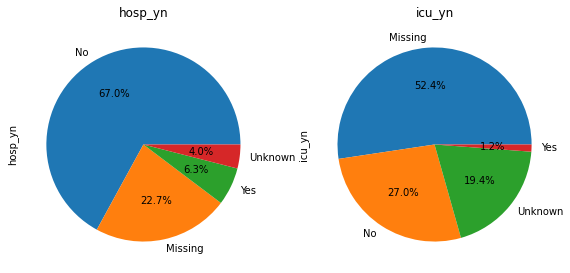

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('hosp_yn')
df2['hosp_yn'].value_counts().plot.pie(autopct="%1.1f%%")

plt.subplot(142)
plt.title('icu_yn')
df2['icu_yn'].value_counts().plot.pie(autopct="%1.1f%%")

**Observation** Only 6.3% of people were hospitalized and in that 1.2% were admitted to an intensive care unit.

In [ ]:
df2['sex'].value_counts()

Female     1512481
Male       1325780
Unknown      14807
Missing       2934
Other          122
Name: sex, dtype: int64

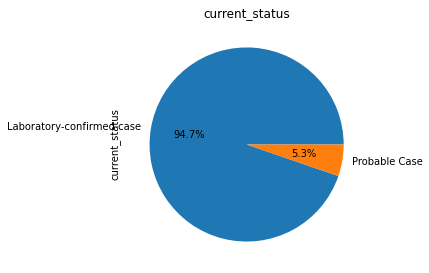

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('current_status')
df2['current_status'].value_counts().plot.pie(autopct="%1.1f%%")

Nearly 94.7% cases are Laboratory-confirmed cases, whereas only 5.3% cases are probable cases.

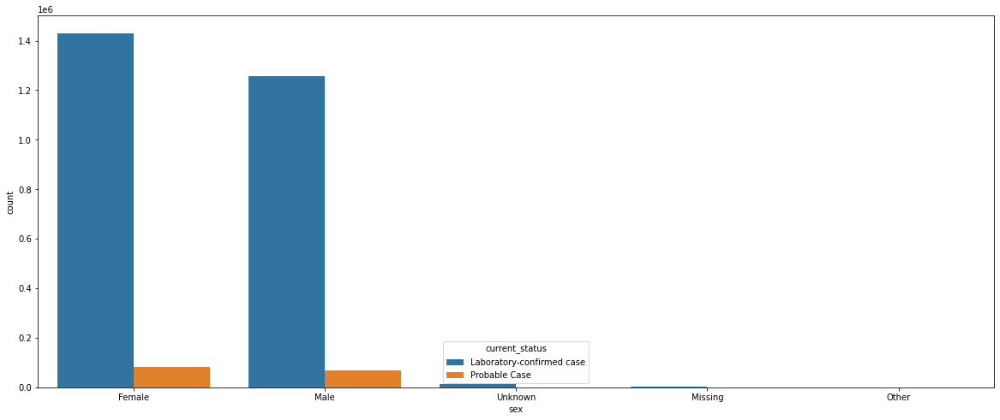

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.sex, hue=df2.current_status)

**Observation** More women were tested positive to covid-19compared to men. By this we can conclude women are more affected to covid-19 virus compared to men. 

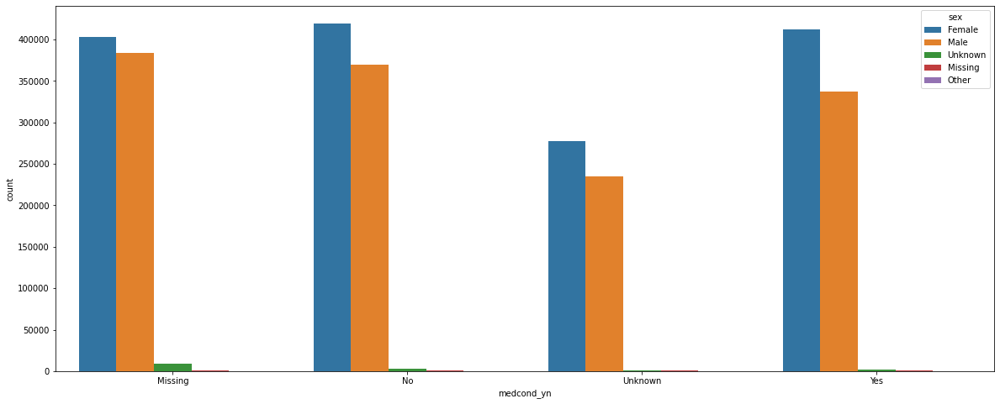

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.medcond_yn, hue=df2.sex)

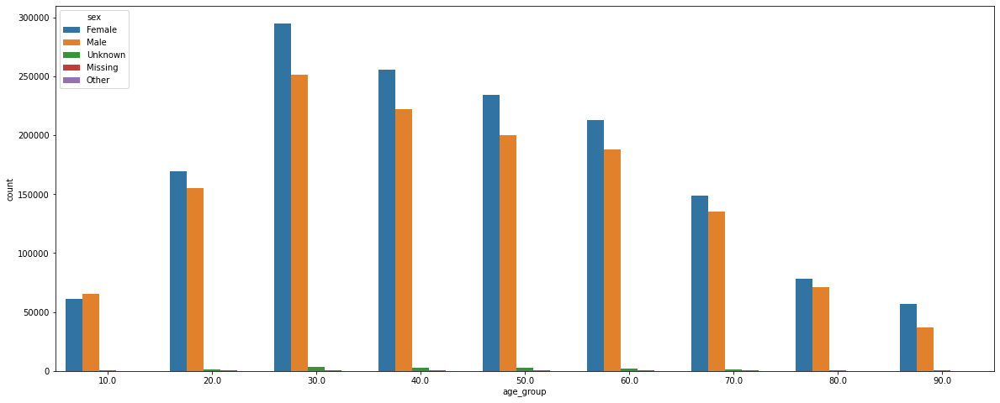

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.age_group, hue=df2.sex)

**Observation** More females are affected in almost all age groups.


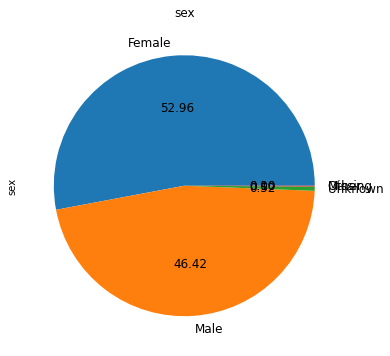

In [ ]:
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.title('sex')
df2['sex'].value_counts().plot.pie(autopct='%.2f', fontsize = 12)

**52.96% are females were affected with covid in usa, whereas males perecentage is 46.42%** 

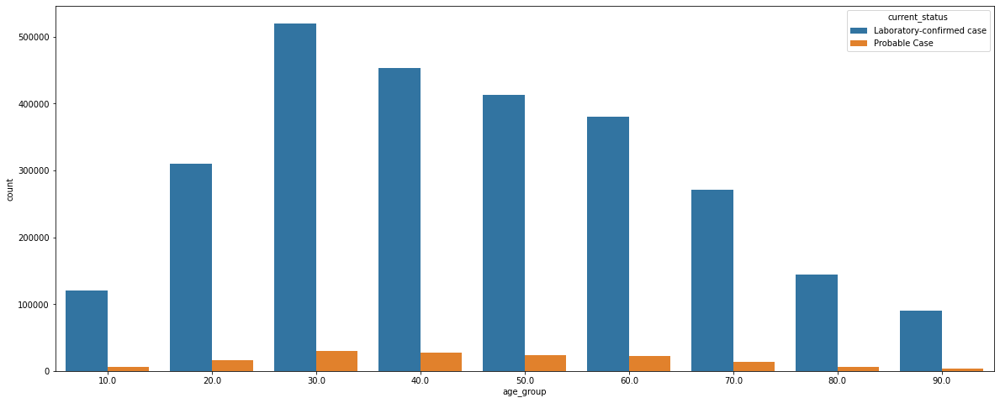

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.age_group, hue=df2.current_status)

#**ML Models**

In [ ]:
# Notebook display modifications

from IPython.core.display import display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

pd.set_option('display.float_format', lambda x: '%.3f' % x)
np.set_printoptions(suppress=True)

In [ ]:
filename = "https://data.cdc.gov/api/views/vbim-akqf/rows.csv?accessType=DOWNLOAD"

df = pd.read_csv(filename)
df.head()

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn
0,2020/10/23,2021/01/28,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",Missing,Missing,No,Missing
1,2020/10/23,2020/10/23,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No
2,2020/10/23,2020/10/25,2020/10/23,2020/10/23,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing
3,2020/10/23,2020/10/25,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",Missing,Missing,Missing,Missing
4,2020/10/23,2020/10/26,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,No,Missing


##**Classifiers and Testing Accuracy**

Classification is a form of data analysis that extracts models describing data classes. A classifier, or classification model, predicts categorical labels (classes). Numeric prediction models continuous-valued functions. Classification and numeric prediction are the two major types of prediction problems.

A classifier utilizes some training data to understand how given input variables relate to the class.When the classifier is trained accurately, it can be used to detect an unknown email. Classification belongs to the category of supervised learning where the targets also provided with the input data.

I'm using following Classifiers

*   Linear Discriminant Classifier
*   Quadratic Discriminant Classifier

*   Decision Tree Classifier
*   Stochastic Gradient Descent Classifier

Linear discriminant analysis is a supervised classification method that is used to create machine learning models. These models based on dimensionality reduction are used for the predictive analysis

LDA (Linear Discriminant Analysis) is used when a linear boundary is required between classifiers and QDA (Quadratic Discriminant Analysis) is used to find a non-linear boundary between classifiers. LDA and QDA work better when the response classes are separable and distribution of X=x for all class is normal.A major difference between the two is that LDA assumes the feature covariance matrices of both classes are the same, which results in a linear decision boundary. In contrast, QDA is less strict and allows different feature covariance matrices for different classes, which leads to a quadratic decision boundary

Decision tree builds classification or regression models in the form of a tree structure. It breaks down a dataset into smaller and smaller subsets while at the same time an associated decision tree is incrementally developed. Decision trees can handle both categorical and numerical data.

Stochastic gradient descent is used to find the model parameters that correspond to the best fit between predicted and actual outputs. It's an inexact but powerful technique





In [ ]:
def yn_to_binary(s: str):
  # Changes Yes/No to 1/0
  return 1 if (s == "Yes") else 0 

df = df.rename(columns={"cdc_case_earliest_dt ": "cdc_case_earliest_dt"})

df = df.drop(columns=["cdc_report_dt"], axis=1) # deprecated
df = df.dropna()

df["cdc_case_earliest_dt"] = pd.to_datetime(df["cdc_case_earliest_dt"])
df["pos_spec_dt"] = pd.to_datetime(df["pos_spec_dt"])
df["onset_dt"] = pd.to_datetime(df["onset_dt"])

df['symptom_development_time_days'] = pd.to_timedelta(df['onset_dt'] - df['cdc_case_earliest_dt']).dt.days
df = df.drop(columns=["pos_spec_dt", "onset_dt"], axis=1)

df["current_status"] = df["current_status"].apply(lambda v: 1 if (v == "Laboratory-confirmed case") else 0)
df["sex"] = df["sex"].apply(lambda v: 1 if (v == "Male") else 0)
df["hosp_yn"] = df["hosp_yn"].apply(yn_to_binary)
df["icu_yn"] = df["icu_yn"].apply(yn_to_binary)

# Drop rows with these missing/unknown values
list_of_cols = ["sex", "age_group", "race_ethnicity_combined", "hosp_yn", "icu_yn", "death_yn", "medcond_yn"]
for col in list_of_cols:
  df = df[(df[col] != "Missing") & (df[col] != "Unknown")]

df["death_yn"] = df["death_yn"].apply(yn_to_binary)
df["medcond_yn"] = df["medcond_yn"].apply(yn_to_binary)

df = df.reset_index().drop(columns=["index"])

In [ ]:
# Dummy variables for race and age
df = pd.get_dummies(df, columns=["age_group", "race_ethnicity_combined"], prefix=["age", "race"])

# Rename columns
df.rename(columns = {
    'race_American Indian/Alaska Native, Non-Hispanic':'race_American Indian/Alaska Native',
    'race_Asian, Non-Hispanic': 'race_Asian',
    'race_Black, Non-Hispanic': 'race_Black',
    'race_Multiple/Other, Non-Hispanic': 'race_Multiple/Other',
    'race_Native Hawaiian/Other Pacific Islander, Non-Hispanic': 'race_Native Hawaiian/Other Pacific Islander',
    'race_White, Non-Hispanic': 'race_White'
}, inplace=True)
df.head()

,cdc_case_earliest_dt,current_status,sex,hosp_yn,icu_yn,death_yn,medcond_yn,symptom_development_time_days,age_0 - 9 Years,age_10 - 19 Years,age_20 - 29 Years,age_30 - 39 Years,age_40 - 49 Years,age_50 - 59 Years,age_60 - 69 Years,age_70 - 79 Years,age_80+ Years,race_American Indian/Alaska Native,race_Asian,race_Black,race_Hispanic/Latino,race_Multiple/Other,race_Native Hawaiian/Other Pacific Islander,race_White
0,2020-10-22,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,2020-10-22,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,2020-10-21,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,2020-10-23,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,2020-10-21,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
# Reorder columns
df2 = df[['cdc_case_earliest_dt','symptom_development_time_days',
             'current_status','medcond_yn','sex','age_0 - 9 Years','age_10 - 19 Years','age_20 - 29 Years',
             'age_30 - 39 Years','age_40 - 49 Years','age_50 - 59 Years','age_60 - 69 Years', 'age_70 - 79 Years', 
             'age_80+ Years','race_Hispanic/Latino','race_Black','race_White','race_Multiple/Other',
             'race_Native Hawaiian/Other Pacific Islander','race_Asian','race_American Indian/Alaska Native',
             'hosp_yn','icu_yn','death_yn']]
df2.head()

,cdc_case_earliest_dt,symptom_development_time_days,current_status,medcond_yn,sex,age_0 - 9 Years,age_10 - 19 Years,age_20 - 29 Years,age_30 - 39 Years,age_40 - 49 Years,age_50 - 59 Years,age_60 - 69 Years,age_70 - 79 Years,age_80+ Years,race_Hispanic/Latino,race_Black,race_White,race_Multiple/Other,race_Native Hawaiian/Other Pacific Islander,race_Asian,race_American Indian/Alaska Native,hosp_yn,icu_yn,death_yn
0,2020-10-22,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,2020-10-22,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,2020-10-21,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,2020-10-23,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,2020-10-21,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [ ]:
# export cleaned data as csv
df2.to_csv("covid_full_clean.csv", index=False)

In [ ]:
#To save accuracy scores for each classifier models
scores = {}

In [ ]:
# Define X and y
X = df.drop(columns=["death_yn", "cdc_case_earliest_dt"], axis=1)
y = df["death_yn"]

# Split data into validation and training datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)


(719595, 22) (719595,) (308398, 22) (308398,)


Linear Discriminant Classifier 

Confusion Matrix: 



,Predicted Survived,Predicted Died
Actually Survived,288612,10317
Actually Died,3080,6389




Accuracy score:  0.9566
Recall Score:  0.6747
Precision:  0.3824




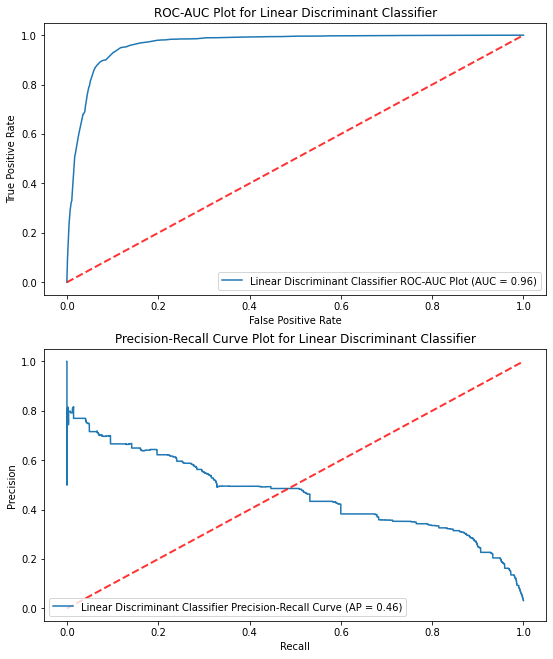

Quadratic Discriminant Classifier 

Confusion Matrix: 



,Predicted Survived,Predicted Died
Actually Survived,247012,51917
Actually Died,357,9112




Accuracy score:  0.8305
Recall Score:  0.9623
Precision:  0.1493




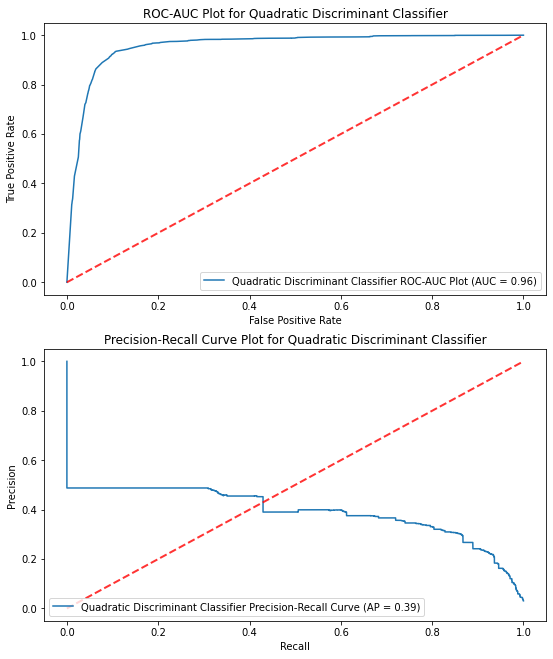

Decision Tree Classifier 

Confusion Matrix: 



,Predicted Survived,Predicted Died
Actually Survived,297387,1542
Actually Died,7092,2377




Accuracy score:  0.972
Recall Score:  0.251
Precision:  0.6065




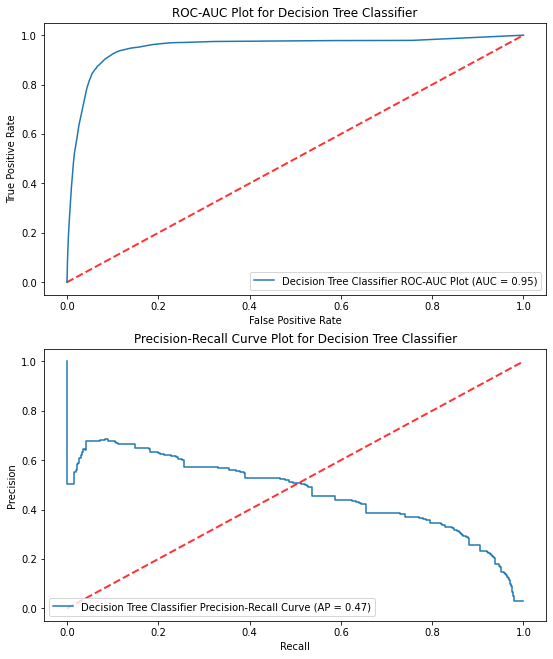

Stochastic Gradient Descent Classifier 

Confusion Matrix: 



,Predicted Survived,Predicted Died
Actually Survived,296568,2361
Actually Died,6620,2849




Accuracy score:  0.9709
Recall Score:  0.3009
Precision:  0.5468




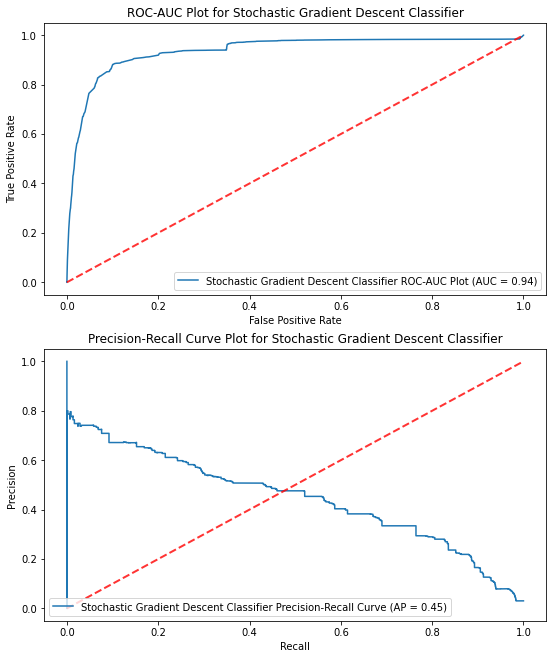

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_absolute_error, recall_score, precision_score, roc_auc_score, roc_curve, plot_precision_recall_curve, plot_roc_curve

classifiers = {
    "Linear Discriminant Classifier":          LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Classifier":       QuadraticDiscriminantAnalysis(),
    "Decision Tree Classifier":                DecisionTreeClassifier(),
    "Stochastic Gradient Descent Classifier":  SGDClassifier()
}

for key, classifier in classifiers.items():
    classifier.fit(X_train, y_train)
    y_score = classifier.predict(X_test)
    print("="*125)
    print(key, "\n")
    print("Confusion Matrix: \n")
    conf_mat = pd.DataFrame(confusion_matrix(y_test, y_score))
    conf_mat.index = ['Actually Survived', 'Actually Died']
    conf_mat.columns = ['Predicted Survived', 'Predicted Died']
    display(conf_mat)
    print("\n")
    accuracy = round(accuracy_score(y_test, y_score), 4)
    print("Accuracy score: ", accuracy)
    print("Recall Score: ", round(recall_score(y_test, y_score), 4))
    print("Precision: ", round(precision_score(y_test, y_score), 4))
    print("\n")
    
    fig,axs = plt.subplots(nrows=2,ncols=1,figsize=(9,11))
    axs[0].set_title("ROC-AUC Plot for " + key)
    plot_roc_curve(classifier, X_test, y_test, ax=axs[0], name=key+" ROC-AUC Plot")
    axs[0].plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
    label='Chance', alpha=.8)

    axs[1].set_title("Precision-Recall Curve Plot for " + key)
    plot_precision_recall_curve(classifier, X_test, y_test, ax=axs[1],name=key+" Precision-Recall Curve")
    axs[1].plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
    label='Chance', alpha=.8)

    scores[key] = accuracy

    plt.show()

    

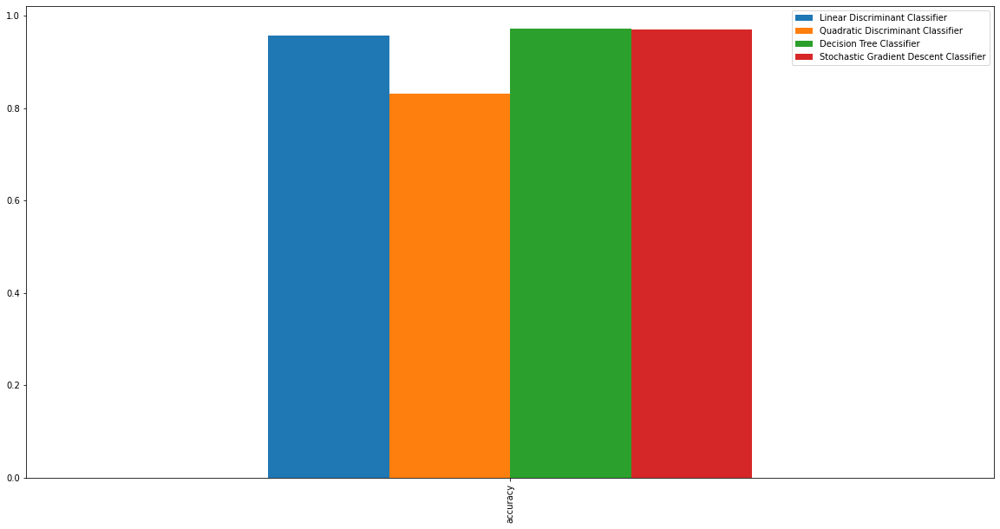

In [ ]:

df1=pd.DataFrame(scores,index=['accuracy'])
df1.plot(kind='bar',figsize=(20,10))
#plt.figure(figsize=(10,10))
plt.show()

#**Summary**



**Title:**  *To Analyse the spread of COVID-19 and its impact on USA population*

**Name:** *Sree Hari Thiriveedhi*

**UIN:** *01086555*



##**Results and Evaluations**
1. Have used 4 classifiers to train and test in finding Deaths and survived
due to covid-19. Following are the classifiers and their accuracy, precession and recall score .

**Linear Discriminant Classifier** 

     Accuracy score:  0.9566

     Recall Score:  0.6747

     Precision:  0.3824


**Quadratic Discriminant Classifier**

      Accuracy score:  0.8305

      Recall Score:  0.9623

      Precision:  0.1493

**Decision Tree Classifier**

     Accuracy score:  0.972

     Recall Score:  0.2512

     Precision:  0.6066


**Stochastic Gradient Descent Classifier**

     Accuracy score:  0.9709

     Recall Score:  0.3008

     Precision:  0.5471


2. Predicted the minimum and maximum rise of covid cases for the next 30, 90,180 days in USA using prophet method

**Predicted covid cases for next 30 days**


    *   Minimum cases: 83574 

    *   Maximum cases: 1.350211e+06

    *   Average cases: 671210

**Predicted covid cases for next 90 days**

    *    Minimum cases: 139657

    *   Maximum cases:  1.407087e+06

    *   Average cases:  763218

**Predicted covid cases for next 180 days**

    *    Minimum cases: 225800

    *   Maximum cases: 1.567794e+06

    *   Average cases: 901720

   
3.   Predicted the minimum and maximum rise of covid deaths for the next 30, 90,180 days in USA

**Predicted covid deaths for next 30 days**

    *   Minimum deaths: 24963

    *   Maximum deaths: 302

    *   Average deaths: 12655

**Predicted covid deaths for next 90 days**

    *    Minimum deaths: 1293

    *   Maximum deaths: 26882

    *   Average deaths: 14833

**Predicted covid deaths for next 180 days**

    *    Minimum deaths: 4502

    *   Maximum deaths: 30891

    *   Average deaths: 18124 

3.   Calculated the Total and Average recovery cases of every state by using cases and deaths as reference

          * New york city has the lowest recovery percent with 96.48% and Alaska has highest recovery percent with 99.49%

4.   Done Analysis for Age Groups and how they are affected by the disease

          * People who died due to covid are mostly 80+ years of age

          * People aged between 20-29 years have high positive rate compared to other aged groups
          
          * Nearly 94.7% cases are laboratory confirmed cases

5.   Calculated total, confirmed and probable cases and deaths

**State with highest and lowest covid cases**

          *State with highest covid-19 cases is California with 3626656.0 cases

          *State with lowest covid-19 cases is Vermont with 22416.0 cases

**State with highest and lowest covid deaths**

          *State with highest covid-19 deaths is California with 3626656.0 cases

          *State with lowest covid-19 deaths is Vermont with 22416.0 cases

**State with highest probable covid cases**

          *State with highest probable covid-19 cases is Georgia with 217670.0.0 cases
        
**State with highest probable covid deaths**

          *State with highest probable covid-19 deaths is NYC with 5090.0 cases

          


#**Youtube Video**
https://www.youtube.com/watch?v=3x-0V0rJYAY






#**Conclusion**


*   New york city has the highest death percent with 3.52% and Alaska has highest recovery percent with 99.49%

*   More Females than males in almost all age groups are affected by the disease

*   51.7% women are affected by the disease and 47.2% of men are affected.

*   By Analysing for age groups we concluded that People between age group 20-29 are the most effected by the disease compared to other age groups

*   As we can see that the **disease maturity** mean is -3 days , which means symptoms set in after being tested positive. Sign of increasing awareness and people getting tested in advance

*  Decision  Classifier achieved 97.2%  training accuracy score and stochastic gradient descent classifier(SGD) achieved 97.0% accuraacy score 

*   Linear discriminant classifier achieved 95.66% and Quadratic classifier achieved 83.05%  accuracy score
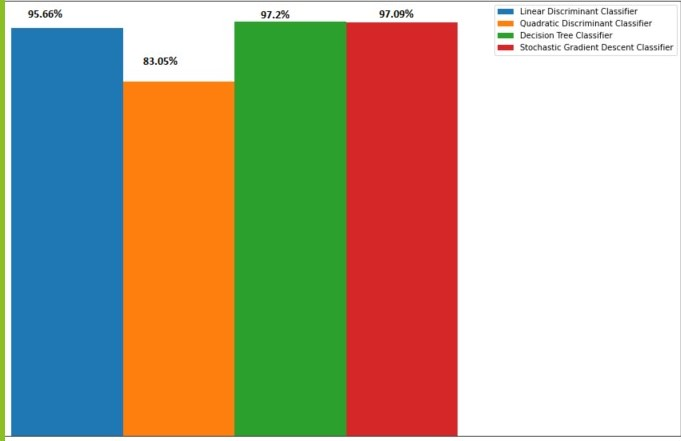








#**Future Work**


*   In future, I will analyze the cases and deaths per county and it's on impact on respective states. I will also analyze how the rural and urban populations are affected as well. 


*   As vaccination process is going on in USA, we can analyse the impact of vaccination on the upcoming daily new cases. 




# **Project Plan:** 

This is an individual effort.

February: Data gathering and clean-up.

March: Initial analysis and identifying patterns

April: Final analysis and predictive modelling
